<a href="https://colab.research.google.com/github/diegolarte/proyecto_integrador/blob/main/Avance1_28Equipo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## TC5035.10
### Proyecto Integrador

<br>

#### Avance 1. Análisis exploratorio de datos
<br>

Este primer avance consiste en realizar un análisis exploratorio de datos (EDA - Exploratory Data Analysis), es decir, describir los datos utilizando técnicas estadísticas y de visualización (análisis univariante y bi/multivariante) para hacer enfoque en sus aspectos más relevantes, así como aplicar y justificar operaciones de preprocesamiento, relacionadas con el manejo de valores faltantes, atípicos y alta cardinalidad. Es importante que incluyan sus conclusiones del EDA, identificando tendencias o relaciones importantes.

Las siguientes son algunas de las preguntas comunes que podrán abordar a través del EDA:

* ¿Hay valores faltantes en el conjunto de datos? ¿Se pueden identificar patrones de ausencia?
* ¿Cuáles son las estadísticas resumidas del conjunto de datos?
* ¿Hay valores atípicos en el conjunto de datos?
* ¿Cuál es la cardinalidad de las variables categóricas?
* ¿Existen distribuciones sesgadas en el conjunto de datos? ¿Necesitamos aplicar alguna transformación no lineal?
* ¿Se identifican tendencias temporales? (En caso de que el conjunto incluya una dimensión de tiempo).
* ¿Hay correlación entre las variables dependientes e independientes?
* ¿Cómo se distribuyen los datos en función de diferentes categorías?
* ¿Existen patrones o agrupaciones (clusters) en los datos con características similares?
* ¿Se deberían normalizar las imágenes para visualizarlas mejor?
* ¿Hay desequilibrio en las clases de la variable objetivo?

# Integrantes del equipo:

*   Zayra Annette lopez Regalado - A00544748
*   Diego Alberto Olarte Mira - A01794028
*   Andres Javier Galindo Vargas - A01793927

Cargar Bases de Datos:


1.   Primera DB: Resultados de encuesta realizada antes de la pandemia
2.   Segunda DB: Resultados de encuesta realizada posterior a la pandemia


In [87]:
from google.colab import drive
#drive.mount('/content/drive')

import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate

In [ ]:
primera_bd = pd.read_excel('/content/Primera BD.xlsx')
segunda_bd = pd.read_excel('/content/Segundo BD.xlsx')



Mostramos las primeras filas

In [ ]:
primera_bd.head()

,Marca temporal,Edad,Sexo,SEXO CLAVE,¿Actualmente vives con tus padres/tutor?,¿Actualmente vives con tus padres/tutor? CLAVE,¿Vives solo?,¿Vives solo? CLAVE,¿De qué estado eres?,¿De qué estado eres? CLAVE,...,PREG21,PREG22,PREG23,PREG24,PREG25,PUNTAJE TOTAL,[Embriología].1,[Bioquímica].1,reprobo 1,1 año atorados
0,2020-09-14 13:44:00.462,18,Masculino,1,Si,1,No,2,Nuevo León,11,...,4,4,4,4,4,100,NaN,NaN,2,2
1,2020-09-14 13:44:05.584,18,Masculino,1,Si,1,No,2,Nuevo León,11,...,4,4,4,4,4,100,NaN,NaN,2,2
2,2020-09-14 14:28:36.419,18,Masculino,1,Si,1,No,2,Nuevo León,11,...,4,4,4,4,4,100,NaN,NaN,2,2
3,2020-09-14 14:28:42.086,18,Masculino,1,Si,1,No,2,Nuevo León,11,...,4,4,4,4,4,100,NaN,NaN,2,2
4,2020-09-14 15:45:41.336,19,Masculino,1,Si,1,No,2,Nuevo León,11,...,4,4,4,4,4,100,NaN,NaN,2,2


In [ ]:
segunda_bd.head()

,Marca temporal,Edad,Sexo,Sexo CLAVE,¿Actualmente vives con tus padres/tutor?,¿Actualmente vives con tus padres/tutor? CLAVE,¿Vives solo?,¿Vives solo? CLAVE,¿De qué estado eres?,¿De qué estado eres? CLAVE,...,PREG18,PREG19,PREG20,PREG21,PREG22,PREG23,PREG24,PREG25,PUNTAJE TOTAL,reprobo 1er semestre?
0,2021-03-16 12:16:01.184,19,Femenino,2,Si,1,No,2,Nuevo León,11,...,2,2,2,1,3,1,3,3,62,NaN
1,2021-03-16 12:21:06.636,20,Femenino,2,No,2,SI,1,Tamaulipas,19,...,2,0,3,4,2,3,3,3,55,NaN
2,2021-03-16 12:39:40.592,18,Femenino,2,Si,1,No,2,Jalisco,10,...,3,1,3,1,1,3,2,3,48,NaN
3,2021-03-16 12:46:53.798,18,Masculino,1,Si,1,No,2,San Luis Potosí,15,...,4,2,2,4,3,3,4,3,65,NaN
4,2021-03-16 12:47:33.993,19,Femenino,2,Si,1,No,2,Nuevo León,11,...,3,3,3,3,3,3,3,3,75,NaN


Verificar tipos de datos

In [100]:
primera_bd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 551 entries, 0 to 550
Data columns (total 80 columns):
 #   Column                                                                                                                                                    Non-Null Count  Dtype         
---  ------                                                                                                                                                    --------------  -----         
 0   Marca temporal                                                                                                                                            551 non-null    datetime64[ns]
 1   Edad                                                                                                                                                      551 non-null    int64         
 2   Sexo                                                                                                                              

In [ ]:
segunda_bd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 85 columns):
 #   Column                                                                                                                                                    Non-Null Count  Dtype         
---  ------                                                                                                                                                    --------------  -----         
 0   Marca temporal                                                                                                                                            654 non-null    datetime64[ns]
 1   Edad                                                                                                                                                      654 non-null    object        
 2   Sexo                                                                                                                              

En la segunda_bd se identifica que la columna edad no esta de tipo numerico, por lo cual se debe hacer una revision y limpieza de los datos

## Limpieza de Datos

Validar los datos mal imputados en la columna edad de la segunda_bd

In [35]:
# Obtener los índices de las filas que contienen texto en la columna "edad"
indices_con_texto = segunda_bd[segunda_bd['Edad'].apply(lambda x: not  str(x).isdigit())].index

# Mostrar los valores de las filas con texto en la columna "edad"
segunda_bd.loc[indices_con_texto, 'Edad']


6       21 años
33      18 años
53      19 años
65      19 años
76      21 años
93      19 años
104     19 años
107     19 años
127    19 años 
167     20 años
180         2p2
183     18 años
187     19 años
190     20 años
209     20 años
221     18 años
258    18 años 
292     20 años
299    18 años.
309     18 AÑOS
313     20 años
329     21 años
332     20 años
348     18 años
453    19 años 
463     21 añoa
527    20 años 
536     20 años
537     19 años
563     20 años
578     20 años
582     19 años
601     20 años
652    20 años 
Name: Edad, dtype: object

In [33]:
# Función para limpiar la columna 'Edad' y extraer solo los números

def limpiar_edad(texto):
    # Utilizamos una expresión regular para buscar números en el texto
    match = re.findall(r'\d+', str(texto))
    if match:
        return int(''.join(match))
    else:
        return None

In [36]:
 # Aplicar la función de limpieza a la columna 'Edad'
 segunda_bd.loc[indices_con_texto, 'Edad'] = segunda_bd.loc[indices_con_texto, 'Edad'].apply(limpiar_edad)

In [37]:
# Mostrar los nuevos valores despues de limpiar la columna Edad"
segunda_bd.loc[indices_con_texto, 'Edad']

6      21
33     18
53     19
65     19
76     21
93     19
104    19
107    19
127    19
167    20
180    22
183    18
187    19
190    20
209    20
221    18
258    18
292    20
299    18
309    18
313    20
329    21
332    20
348    18
453    19
463    21
527    20
536    20
537    19
563    20
578    20
582    19
601    20
652    20
Name: Edad, dtype: object

In [47]:
# Convertir la columna 'Edad' a tipo int
segunda_bd['Edad'] = segunda_bd['Edad'].astype(int)

In [49]:
# Validar que el tipo de dato ha cambiado a Int64
segunda_bd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 85 columns):
 #   Column                                                                                                                                                    Non-Null Count  Dtype         
---  ------                                                                                                                                                    --------------  -----         
 0   Marca temporal                                                                                                                                            654 non-null    datetime64[ns]
 1   Edad                                                                                                                                                      654 non-null    int64         
 2   Sexo                                                                                                                              

##¿Hay valores faltantes en el conjunto de datos? ¿Se pueden identificar patrones de ausencia?

### Primera *bd*

In [54]:
# 1. Valores faltantes
missing_values_primera = primera_bd.isnull().sum()

# Filtrar para mostrar solo columnas con uno o más valores faltantes
missing_values_primera_filtered = missing_values_primera[missing_values_primera > 0]

print("Valores faltantes por columna con uno o más valores faltantes:")
print(missing_values_primera_filtered)

Valores faltantes por columna con uno o más valores faltantes:
AÑOS recurso                                          548
MATERIAS recurso total                                548
Semestres que recurso                                 551
 [Embriología]                                        334
 [Bioquímica]                                         420
 [Introducción a la medicina]                         548
 [Optativa 1 semestre]                                537
 [Biología celular y tisular]                         357
 [IBC]                                                492
 [Responsabilidad Social y Desarrollo Sustentable]    544
 [Optativa 2 semestre]                                535
 [Embriología].1                                      334
 [Bioquímica].1                                       420
dtype: int64


Despues de hacer el análisis de los datos faltantes para la primera bd , para las columnas:

*   AÑOS recurso  
*   MATERIAS recurso total
*   Semestres que recurso
*   [Embriología].1
*   [Bioquímica].1

tiene sentido que hayan valores faltantes, ya que estas columnas no son directamente inputadas desde la encuesta, estas son columnas que imputaron los investigadores manualmente para tratar de generar nuevas features, por lo tanto se pueden eliminar de la base

Para las columnas:
* [Embriología]                                     
* [Bioquímica]                                      
* [Introducción a la medicina]                      
* [Optativa 1 semestre]                             
* [Biología celular y tisular]                      
* [IBC]                                             
* [Responsabilidad Social y Desarrollo Sustentable]
* [Optativa 2 semestre]

Tiene sentido que hayan valores faltantes ya que en este caso el nulo o vacio significa que el estudiante no reprobo esta materia

In [61]:
# Eliminar las columnas que no se necesitan

primera_bd = primera_bd.drop(['AÑOS recurso', 'MATERIAS recurso total', 'Semestres que recurso ', ' [Embriología]', ' [Bioquímica].1'], axis=1)


### Segunda bd

In [55]:
# 1. Valores faltantes
missing_values_segunda = segunda_bd.isnull().sum()

# Filtrar para mostrar solo columnas con uno o más valores faltantes
missing_values_segunda_filtered = missing_values_segunda[missing_values_segunda > 0]

print("Valores faltantes por columna con uno o más valores faltantes:")
print(missing_values_segunda_filtered)

Valores faltantes por columna con uno o más valores faltantes:
¿Cuentas con dispositivo electrónico? [Telefono inteligente (smartphone)]         8
¿Cuentas con dispositivo electrónico? [Tableta]                                  53
¿Cuentas con dispositivo electrónico? [Computadora (Laptop o de escritorio)]     10
 [Embriología]                                                                  317
 [Bioquímica]                                                                   447
 [Introducción a la medicina]                                                   646
 [Optativa 1 semestre]                                                          642
 [Biología celular y tisular]                                                   405
 [IBC]                                                                          488
 [Responsabilidad Social y Desarrollo Sustentable]                              638
 [Optativa 2 semestre]                                                          637
reprobo 1er s

Despues de hacer el análisis de los datos faltantes para la segunda bd , para las columna:

*   reprobo 1er semestre?

tiene sentido que hayan valores faltantes, ya que esta columna no es directamente inputadas desde la encuesta, estas son columnas que imputaron los investigadores manualmente para tratar de generar nuevas features, por lo tanto se pueden eliminar de la base

Para las columnas:
* [Embriología]                                     
* [Bioquímica]                                      
* [Introducción a la medicina]                      
* [Optativa 1 semestre]                             
* [Biología celular y tisular]                      
* [IBC]                                             
* [Responsabilidad Social y Desarrollo Sustentable]
* [Optativa 2 semestre]

Tiene sentido que hayan valores faltantes ya que en este caso el nulo o vacio significa que el estudiante no reprobo esta materia

Para las columnas:
* ¿Cuentas con dispositivo electrónico? [Telefono inteligente (smartphone)]
* ¿Cuentas con dispositivo electrónico? [Tableta]
* ¿Cuentas con dispositivo electrónico? [Computadora (Laptop o de escritorio)]

No tiene sentido que hayan valores faltantes , ya que son preguntas obligatorias de la encuesta , por lo tanto fue que no fueron imputadas en la encuesta y posteriormente se dará manejo

In [79]:
# Eliminar las columnas que no se necesitan

segunda_bd = segunda_bd.drop(['reprobo 1er semestre?'], axis=1)


##¿Cuáles son las estadísticas resumidas del conjunto de datos?

### Primera bd

A continuación , un analisis resumido de las estadisticas, en la seccion de analisis preliminar se realiza un analisis mas detallado

In [63]:
summary_statistics = primera_bd.describe()
print("Estadísticas resumidas:")
print(summary_statistics)

Estadísticas resumidas:
                      Marca temporal        Edad  SEXO CLAVE  \
count                            551  551.000000  551.000000   
mean   2020-09-14 00:47:21.674105088   19.426497    1.602541   
min       2020-09-08 12:19:16.294000   17.000000    1.000000   
25%    2020-09-11 15:47:57.872999936   19.000000    1.000000   
50%    2020-09-14 14:28:36.419000064   19.000000    2.000000   
75%    2020-09-14 21:26:18.131500032   20.000000    2.000000   
max       2020-10-02 22:00:48.842000   30.000000    2.000000   
std                              NaN    1.492267    0.489817   

       ¿Actualmente vives con tus padres/tutor?  CLAVE  ¿Vives solo? CLAVE  \
count                                       551.000000          551.000000   
mean                                          1.150635            1.903811   
min                                           1.000000            1.000000   
25%                                           1.000000            2.000000   
50%      

### Segunda bd

In [62]:
summary_statistics = segunda_bd.describe()
print("Estadísticas resumidas:")
print(summary_statistics)

Estadísticas resumidas:
                      Marca temporal        Edad  Sexo CLAVE  \
count                            654  654.000000   654.00000   
mean   2021-03-18 23:23:13.183558144   19.510703     1.70948   
min       2021-03-16 12:16:01.184000   16.000000     1.00000   
25%    2021-03-16 19:40:20.864499968   19.000000     1.00000   
50%    2021-03-16 22:52:05.211500032   19.000000     2.00000   
75%    2021-03-17 23:52:16.015750144   20.000000     2.00000   
max       2021-04-29 15:05:05.623000   28.000000     2.00000   
std                              NaN    1.320950     0.45435   

       ¿Actualmente vives con tus padres/tutor?  CLAVE  ¿Vives solo? CLAVE  \
count                                       654.000000          654.000000   
mean                                          1.076453            1.940367   
min                                           1.000000            1.000000   
25%                                           1.000000            2.000000   
50%      

##¿Hay valores atípicos en el conjunto de datos?

### Primera bd

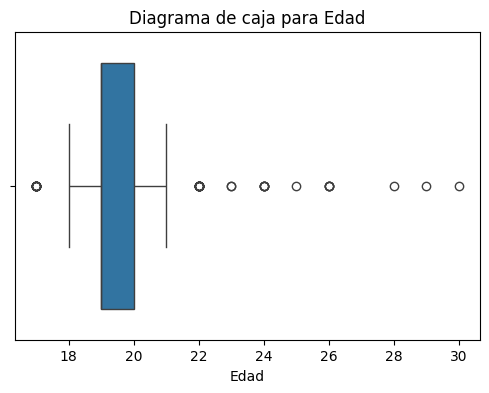

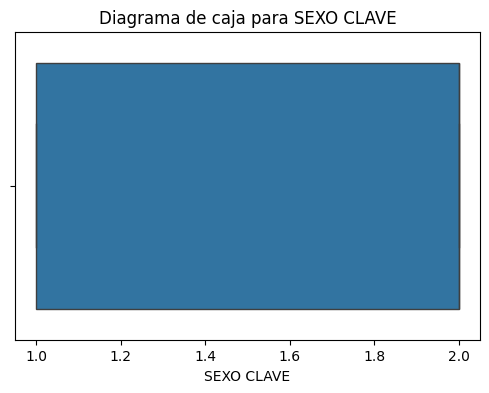

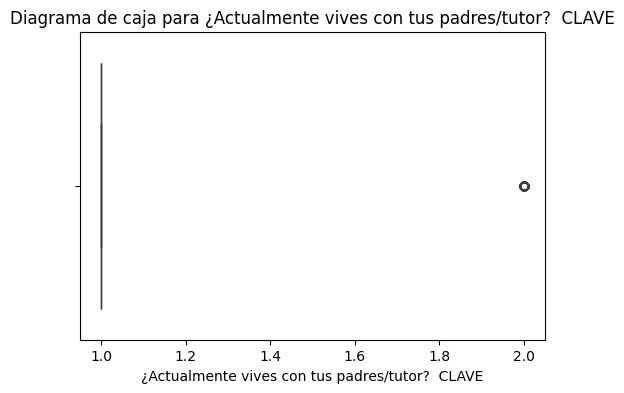

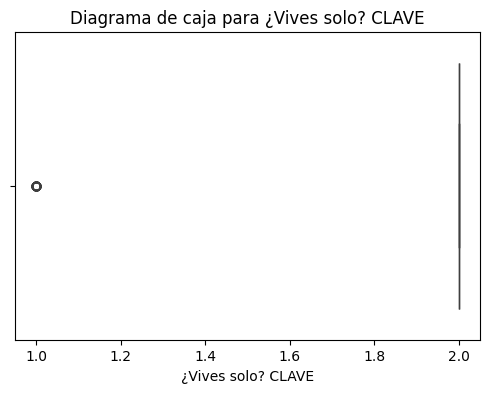

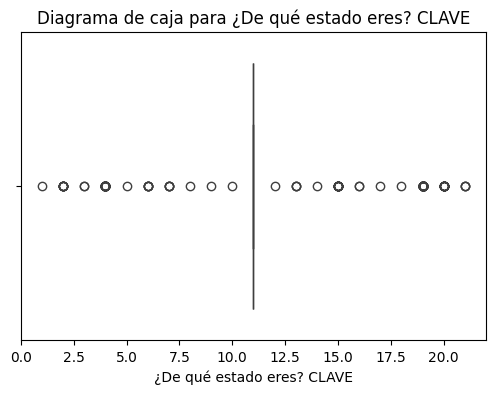

...

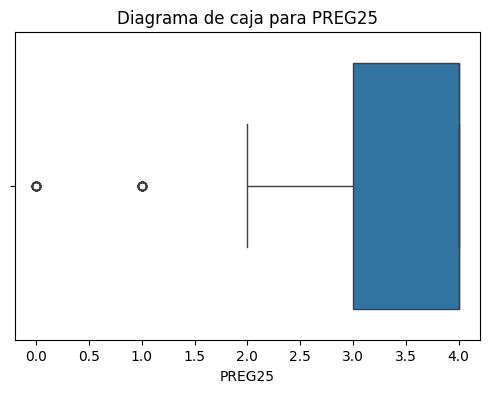

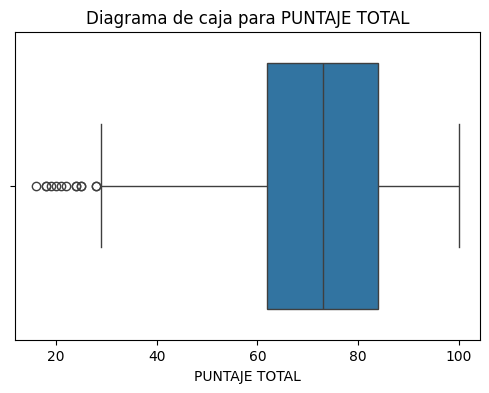

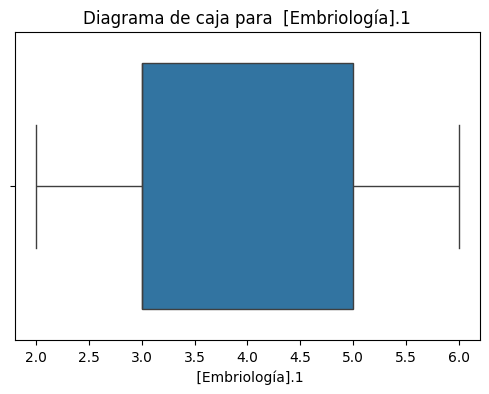

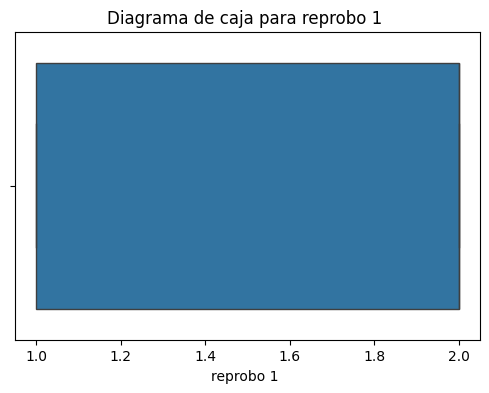

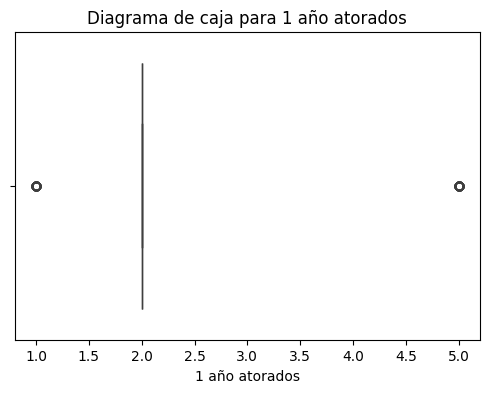

In [80]:
# Listar las columnas numéricas
numeric_columns = primera_bd.select_dtypes(include=['int64', 'float64']).columns

# Graficar diagrama de caja para cada variable numérica
for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=primera_bd[column])
    plt.title(f'Diagrama de caja para {column}')
    plt.show()

### Segunda bd

In [76]:
numeric_columns

Index(['Edad', 'Sexo CLAVE', '¿Actualmente vives con tus padres/tutor?  CLAVE',
       '¿Vives solo? CLAVE', '¿De qué estado eres? CLAVE',
       '¿Cuentas con acceso a internet en casa? CLAVE',
       '¿Cuentas con dispositivo electrónico? [Telefono inteligente (smartphone)] CLAVE',
       '¿Cuentas con dispositivo electrónico? [Tableta] CLAVE',
       '¿Cuentas con dispositivo electrónico? [Computadora (Laptop o de escritorio)] CLAVE',
       '¿Actualmente trabajas? CLAVE',
       '¿Has dejado otra materia en la carrera? Si sí, ¿Cuál o Cuáles y en qué oportunidad la dejaste? (2 oportunidad, 3 oportunidad, 4 oportunidad, etc.) CLAVE',
       ' [Embriología]', ' [Bioquímica]', ' [Introducción a la medicina]',
       ' [Optativa 1 semestre]', ' [Biología celular y tisular]', ' [IBC]',
       ' [Responsabilidad Social y Desarrollo Sustentable]',
       ' [Optativa 2 semestre]', 'PREG1', 'PREG2', 'PREG3', 'PREG4', 'PREG5',
       'PREG6', 'PREG7', 'PREG8', 'PREG9', 'PREG10', 'PREG11', 'PR

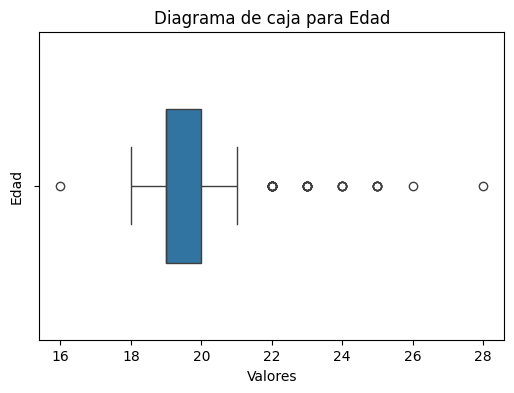

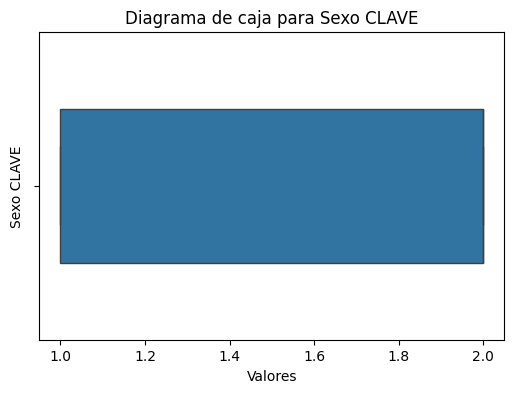

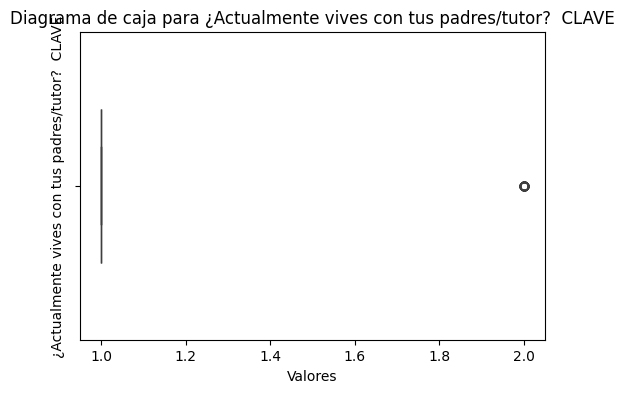

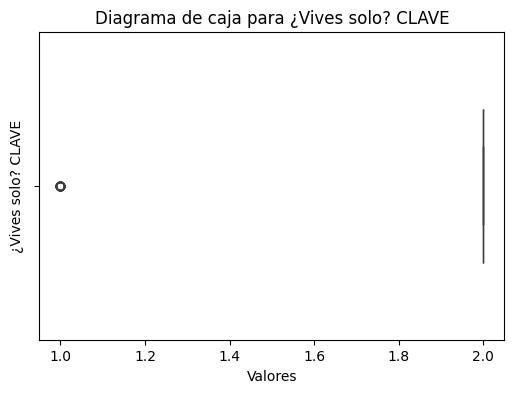

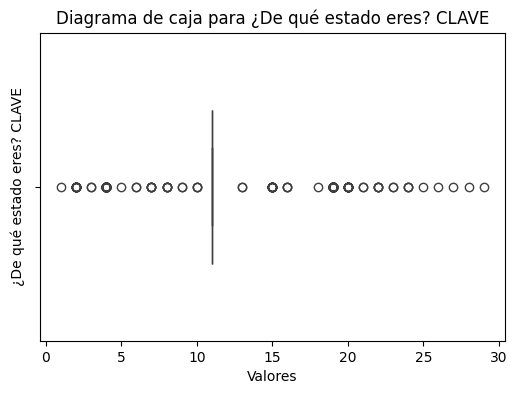

...

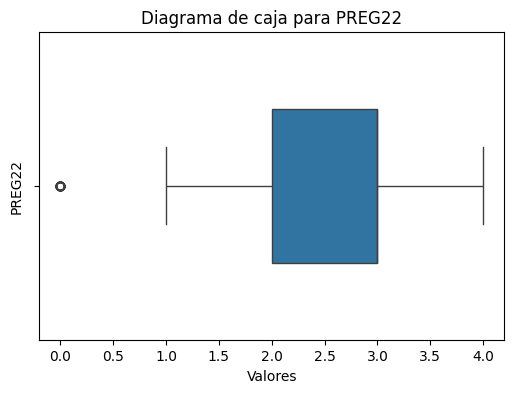

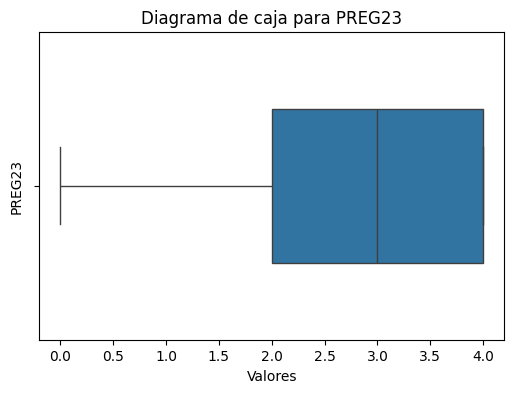

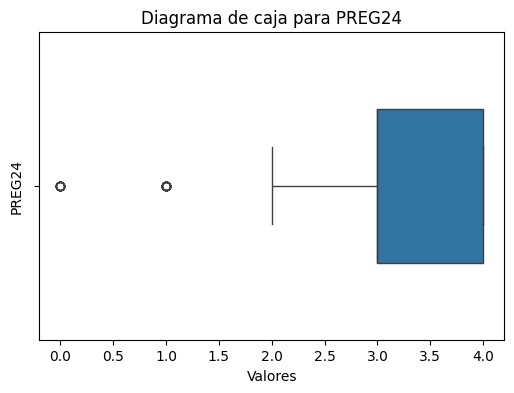

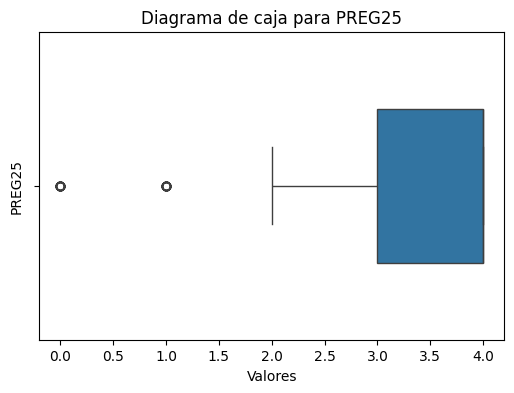

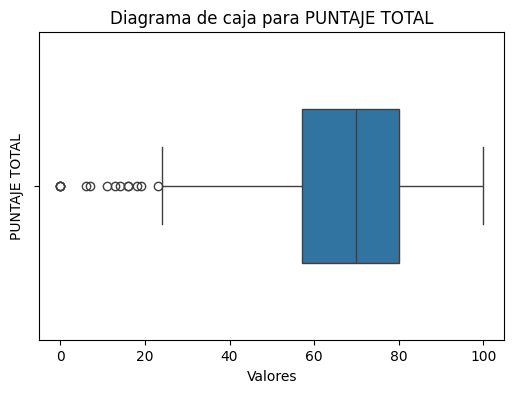

In [81]:
# Listar las columnas numéricas
numeric_columns = segunda_bd.select_dtypes(include=['int64', 'float64']).columns

# Graficar diagrama de caja para cada variable numérica
for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=segunda_bd[column], width=0.5)
    plt.title(f'Diagrama de caja para {column}')
    plt.ylabel(column)  # Nombre del eje y como el nombre de la columna
    plt.xlabel('Valores')  # Nombre del eje x
    plt.show()

##¿Cuál es la cardinalidad de las variables categóricas?

### Primera bd

In [88]:
# Cardinalidad de variables categóricas
categorical_cardinality = primera_bd.select_dtypes(include=['object']).nunique()

# Valores únicos de variables categóricas
categorical_unique_values = {}
for column in categorical_cardinality.index:
    unique_values = primera_bd[column].unique()
    categorical_unique_values[column] = unique_values
# Convertir los datos en un formato adecuado para tabulate
table_data = []
for column, values in categorical_unique_values.items():
    table_data.append([column, categorical_cardinality[column], ', '.join(map(str, values))])

# Mostrar la tabla
print(tabulate(table_data, headers=["Variable", "Cardinalidad", "Valores Únicos"], tablefmt="grid"))


+----------------------------------------------------------------------------------------------------------------------------------------------------+----------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Variable                                                                                                                                           |   Cardinalidad | Valores Únicos                                                                                                                                                                                                                                 |
+====================================================================================================================================================+================+===============

### Segunda bd

In [89]:
# Cardinalidad de variables categóricas
categorical_cardinality = segunda_bd.select_dtypes(include=['object']).nunique()

# Valores únicos de variables categóricas
categorical_unique_values = {}
for column in categorical_cardinality.index:
    unique_values = segunda_bd[column].unique()
    categorical_unique_values[column] = unique_values
# Convertir los datos en un formato adecuado para tabulate
table_data = []
for column, values in categorical_unique_values.items():
    table_data.append([column, categorical_cardinality[column], ', '.join(map(str, values))])

# Mostrar la tabla
print(tabulate(table_data, headers=["Variable", "Cardinalidad", "Valores Únicos"], tablefmt="grid"))

+----------------------------------------------------------------------------------------------------------------------------------------------------+----------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Variable                                                                                                                                           |   Cardinalidad | Valores Únicos                                                                                                                                                                                                                                                                                                   |
+=================================================

##¿Existen distribuciones sesgadas en el conjunto de datos? ¿Necesitamos aplicar alguna transformación no lineal?

### Primera bd

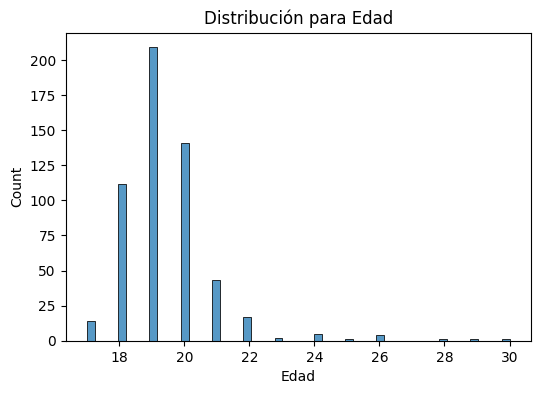

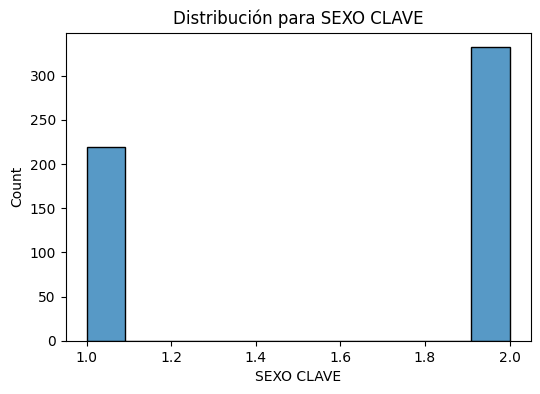

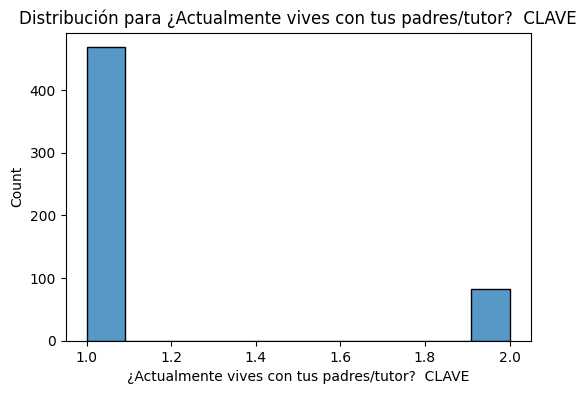

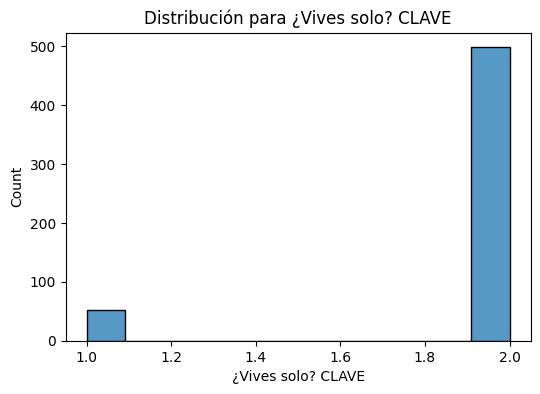

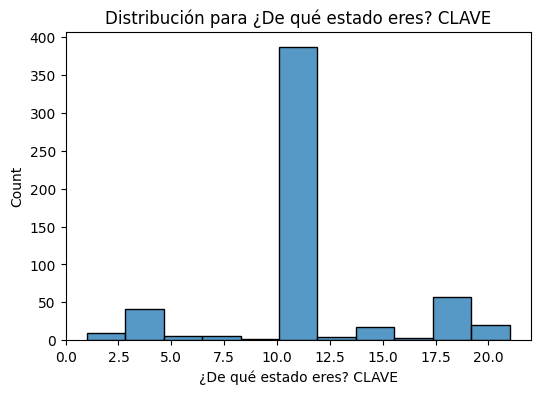

...

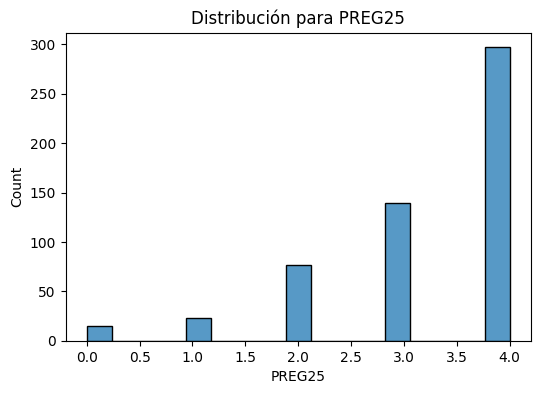

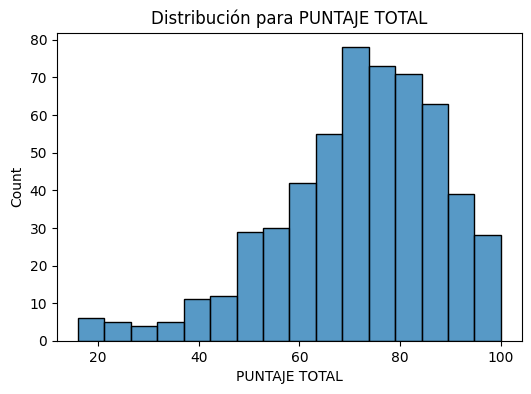

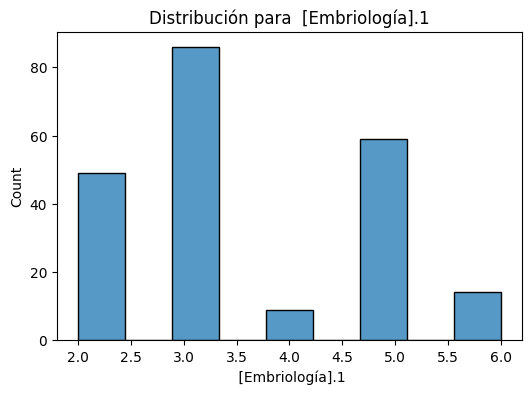

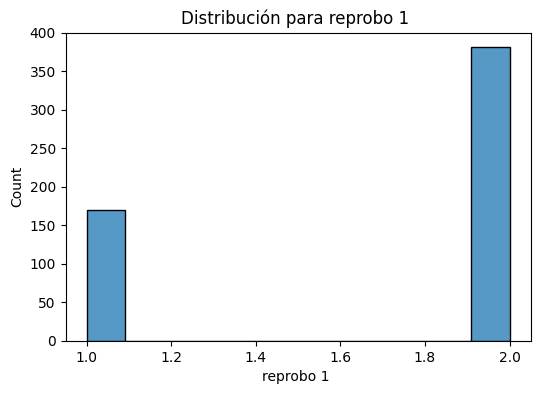

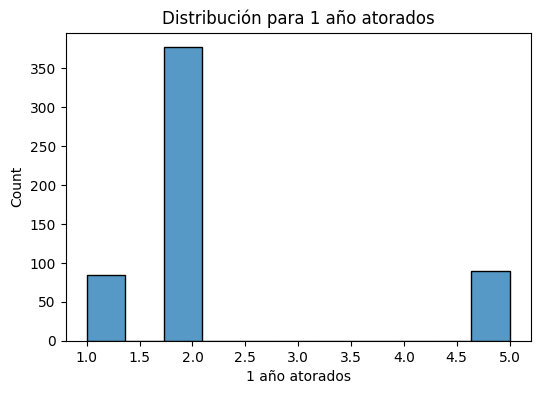

In [93]:
# Listar las columnas numéricas
numeric_columns = primera_bd.select_dtypes(include=['int64', 'float64']).columns

# Graficar diagrama de caja para cada variable numérica
for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(x=primera_bd[column])
    plt.title(f'Distribución para {column}')
    plt.show()

### Segunda bd

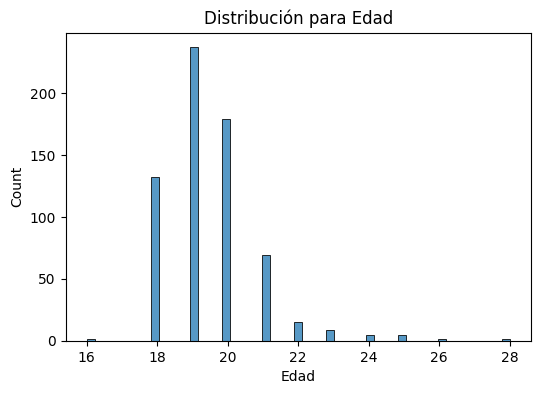

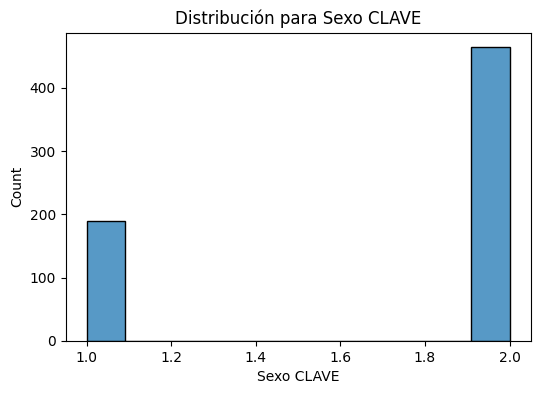

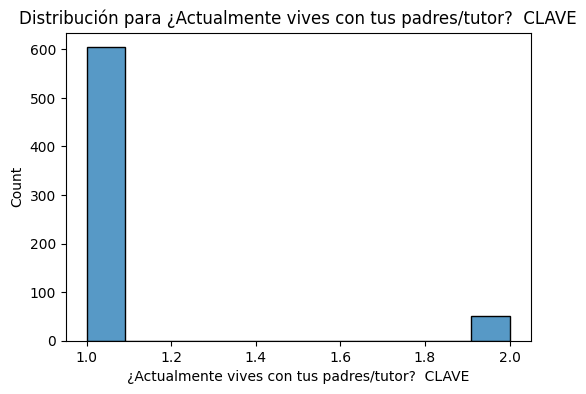

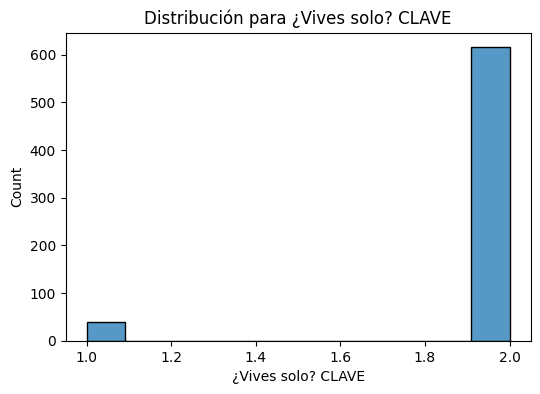

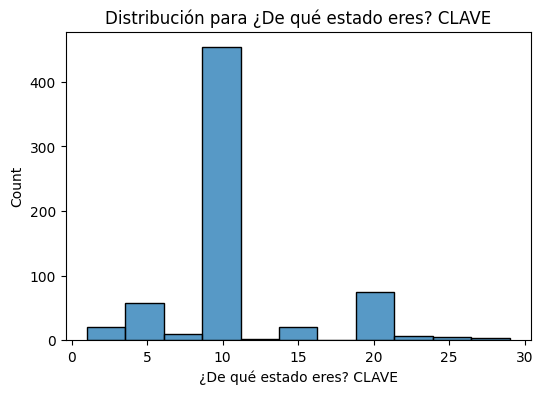

...

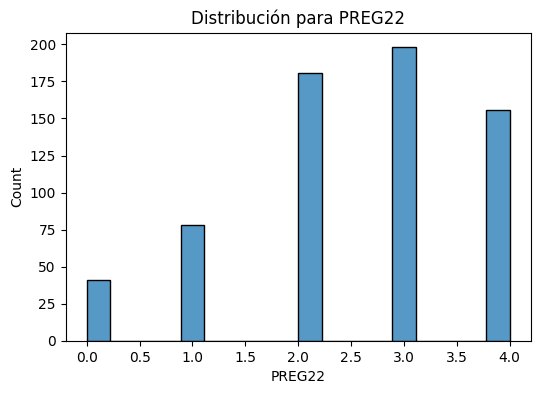

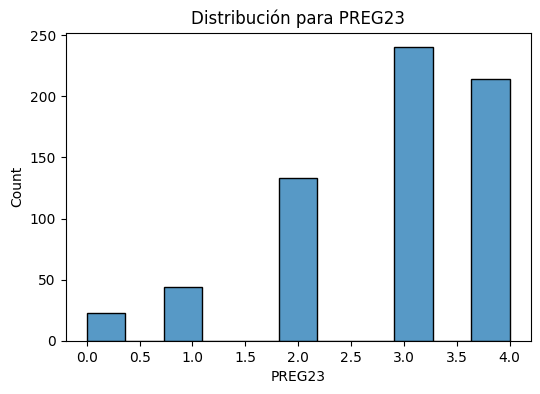

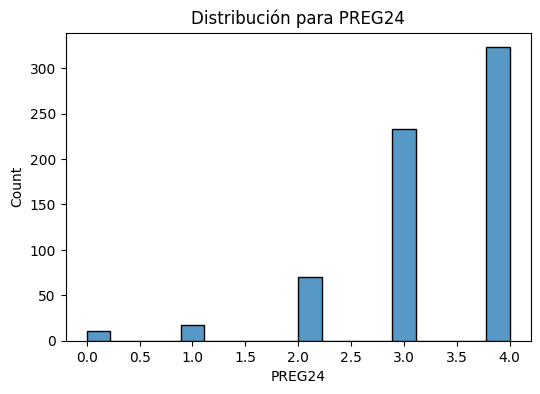

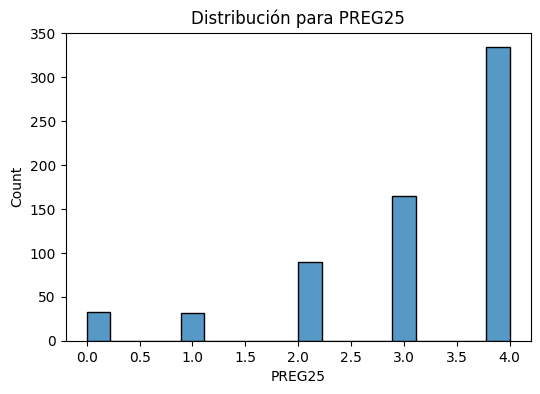

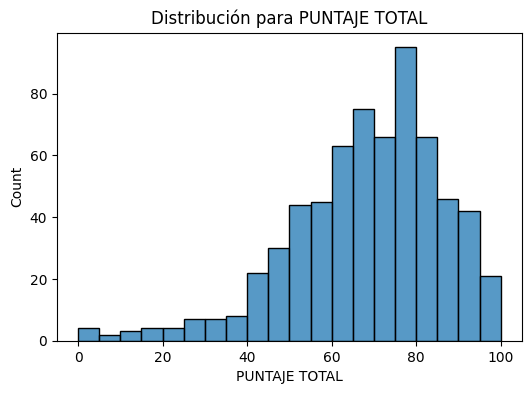

In [94]:
# Listar las columnas numéricas
numeric_columns = segunda_bd.select_dtypes(include=['int64', 'float64']).columns

# Graficar diagrama de caja para cada variable numérica
for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(x=segunda_bd[column])
    plt.title(f'Distribución para {column}')
    plt.show()

###¿Se identifican tendencias temporales? (En caso de que el conjunto incluya una dimensión de tiempo)

En el momento solo se cuenta con una dimension de tiempo que es la fecha en la que se registro la encuesta, sin embargo en este caso no se pueden identificar tendencias ya que solo se registraron encuestas en un periodo entre marzo y abril pero no se siguieron registrando continuamente, sin embargo en un futuro pensamos construir una variable que nos indique el tiempo como antes y despues de la pandemia para unir las dos bases y ver sus diferencias

##¿Hay correlación entre las variables dependientes e independientes?

##primera bd

In [172]:
# Lista de columnas independientes
variables_independientes = [
    'Edad',
    'Sexo',
    'SEXO CLAVE',
    '¿Actualmente vives con tus padres/tutor?  ' ,
    '¿Actualmente vives con tus padres/tutor?  CLAVE',
    '¿Vives solo?',
    '¿Vives solo? CLAVE',
    '¿De qué estado eres?',
    '¿De qué estado eres? CLAVE',
    'Normalmente,  ¿cuánto tardas en llegar a la facultad?',
    'Normalmente,  ¿cuánto tardas en llegar a la facultad? CLAVE',
    '¿Actualmente trabajas?',
    '¿Actualmente trabajas? CLAVE',
    '¿Es la primera universidad a la que aplicaste? Si la respuesta es no ¿Cuántos intentos te tomó entrar a universidades previas? ',
    '¿Es la primera universidad a la que aplicaste? Si la respuesta es no ¿Cuántos intentos te tomó entrar a universidades previas? CLAVE',
    '¿Cuántos intentos utilizaste para entrar a esta universidad?',
    '¿Has dejado otra materia en la carrera? Si sí, ¿Cuál o Cuáles y en qué oportunidad la dejaste? (2 oportunidad, 3 oportunidad, 4 oportunidad, etc.)',
    '¿Has dejado otra materia en la carrera? Si sí, ¿Cuál o Cuáles y en qué oportunidad la dejaste? (2 oportunidad, 3 oportunidad, 4 oportunidad, etc.) CLAVE'
]

# Filtrar el DataFrame por las columnas deseadas
df_independiente = primera_bd.loc[:, variables_independientes]

In [173]:
# Lista de columnas dependientes
variables_dependientes = [
    'PREG1',
    'PREG2',
    'PREG3',
    'PREG4',
    'PREG5',
    'PREG6',
    'PREG7',
    'PREG8',
    'PREG9',
    'PREG10',
    'PREG11',
    'PREG12',
    'PREG13',
    'PREG14',
    'PREG15',
    'PREG16',
    'PREG17',
    'PREG18',
    'PREG19',
    'PREG20',
    'PREG21',
    'PREG22',
    'PREG23',
    'PREG24',
    'PREG25',
    'PUNTAJE TOTAL'
]

# Filtrar el DataFrame por las columnas deseadas
df_dependiente = primera_bd.loc[:, variables_dependientes]


In [174]:
   variables = ['Edad',
    'SEXO CLAVE',
    '¿Actualmente vives con tus padres/tutor?  CLAVE',
    '¿Vives solo? CLAVE',
    '¿De qué estado eres? CLAVE',
    'Normalmente,  ¿cuánto tardas en llegar a la facultad? CLAVE',
    '¿Actualmente trabajas? CLAVE',
    '¿Es la primera universidad a la que aplicaste? Si la respuesta es no ¿Cuántos intentos te tomó entrar a universidades previas? CLAVE',
    '¿Has dejado otra materia en la carrera? Si sí, ¿Cuál o Cuáles y en qué oportunidad la dejaste? (2 oportunidad, 3 oportunidad, 4 oportunidad, etc.) CLAVE',
    'PREG1',
    'PREG2',
    'PREG3',
    'PREG4',
    'PREG5',
    'PREG6',
    'PREG7',
    'PREG8',
    'PREG9',
    'PREG10',
    'PREG11',
    'PREG12',
    'PREG13',
    'PREG14',
    'PREG15',
    'PREG16',
    'PREG17',
    'PREG18',
    'PREG19',
    'PREG20',
    'PREG21',
    'PREG22',
    'PREG23',
    'PREG24',
    'PREG25',
    'PUNTAJE TOTAL']

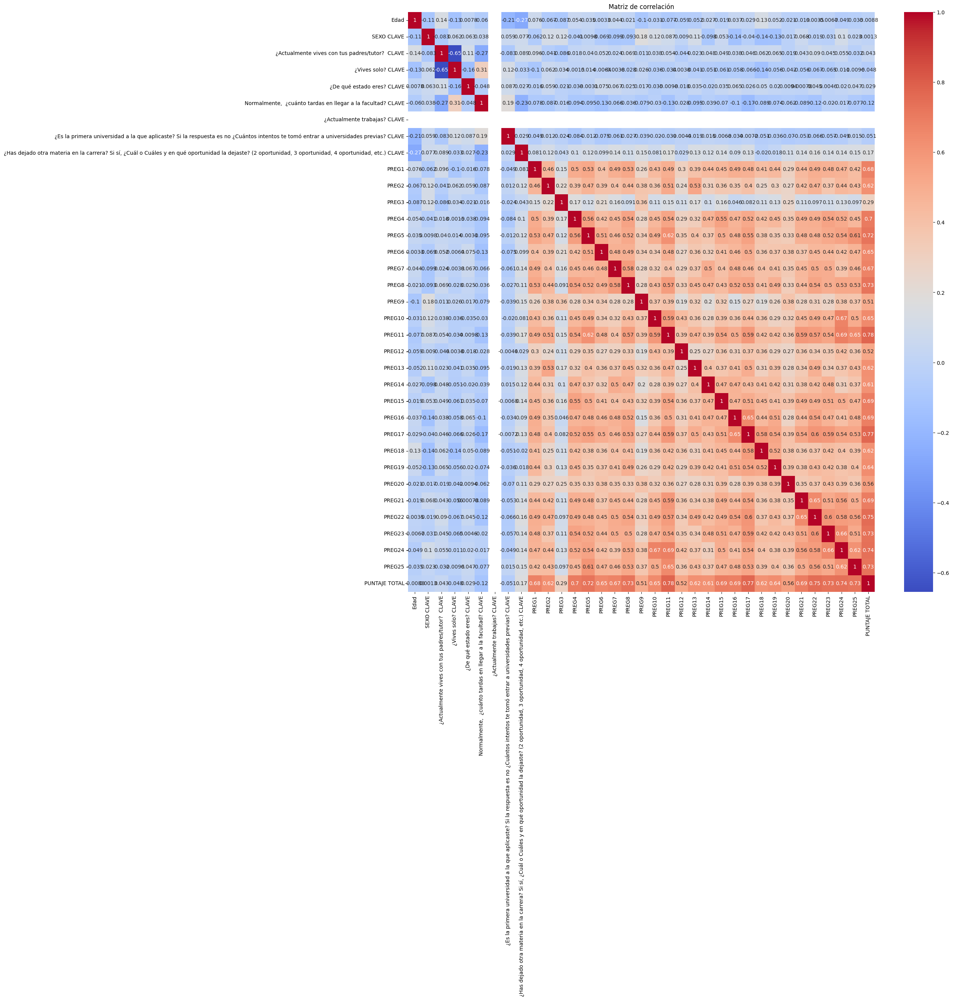

In [175]:
correlation_matrix = primera_bd.loc[:, variables].corr()
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Matriz de correlación")
plt.show()

##segunda bd

In [170]:
# Lista de columnas independientes
variables_independientes = [
    "Edad",
    "Sexo CLAVE",
    "¿Actualmente vives con tus padres/tutor?  CLAVE",
    "¿Vives solo? CLAVE",
    "¿De qué estado eres? CLAVE",
    "¿Cuentas con acceso a internet en casa? CLAVE",
    "¿Cuentas con dispositivo electrónico? [Telefono inteligente (smartphone)] CLAVE",
    "¿Cuentas con dispositivo electrónico? [Tableta] CLAVE",
    "¿Cuentas con dispositivo electrónico? [Computadora (Laptop o de escritorio)] CLAVE",
    "¿Actualmente trabajas? CLAVE",
    "¿Has dejado otra materia en la carrera? Si sí, ¿Cuál o Cuáles y en qué oportunidad la dejaste? (2 oportunidad, 3 oportunidad, 4 oportunidad, etc.) CLAVE"
]

# Filtrar el DataFrame por las columnas deseadas
df_independiente = segunda_bd.loc[:, variables_independientes]

In [171]:
# Lista de columnas dependientes
variables_dependientes = [
    'PREG1',
    'PREG2',
    'PREG3',
    'PREG4',
    'PREG5',
    'PREG6',
    'PREG7',
    'PREG8',
    'PREG9',
    'PREG10',
    'PREG11',
    'PREG12',
    'PREG13',
    'PREG14',
    'PREG15',
    'PREG16',
    'PREG17',
    'PREG18',
    'PREG19',
    'PREG20',
    'PREG21',
    'PREG22',
    'PREG23',
    'PREG24',
    'PREG25',
    'PUNTAJE TOTAL'
]

# Filtrar el DataFrame por las columnas deseadas
df_dependiente = segunda_bd.loc[:, variables_dependientes]


In [178]:
   variables = ["Edad",
    "Sexo CLAVE",
    "¿Actualmente vives con tus padres/tutor?  CLAVE",
    "¿Vives solo? CLAVE",
    "¿De qué estado eres? CLAVE",
    "¿Cuentas con acceso a internet en casa? CLAVE",
    "¿Cuentas con dispositivo electrónico? [Telefono inteligente (smartphone)] CLAVE",
    "¿Cuentas con dispositivo electrónico? [Tableta] CLAVE",
    "¿Cuentas con dispositivo electrónico? [Computadora (Laptop o de escritorio)] CLAVE",
    "¿Actualmente trabajas? CLAVE",
    "¿Has dejado otra materia en la carrera? Si sí, ¿Cuál o Cuáles y en qué oportunidad la dejaste? (2 oportunidad, 3 oportunidad, 4 oportunidad, etc.) CLAVE",
    'PREG1',
    'PREG2',
    'PREG3',
    'PREG4',
    'PREG5',
    'PREG6',
    'PREG7',
    'PREG8',
    'PREG9',
    'PREG10',
    'PREG11',
    'PREG12',
    'PREG13',
    'PREG14',
    'PREG15',
    'PREG16',
    'PREG17',
    'PREG18',
    'PREG19',
    'PREG20',
    'PREG21',
    'PREG22',
    'PREG23',
    'PREG24',
    'PREG25',
    'PUNTAJE TOTAL']

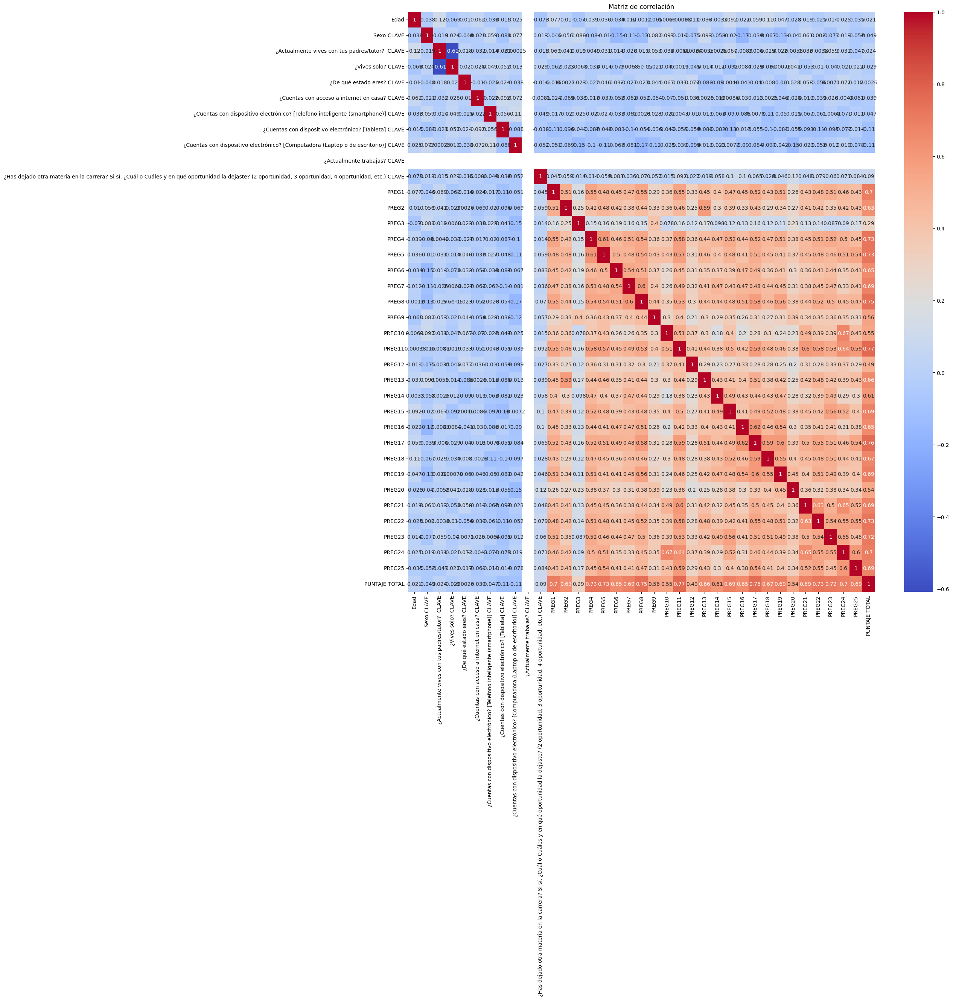

In [179]:
correlation_matrix = segunda_bd.loc[:, variables].corr()
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Matriz de correlación")
plt.show()

##¿Cómo se distribuyen los datos en función de diferentes categorías?


### Primera bd

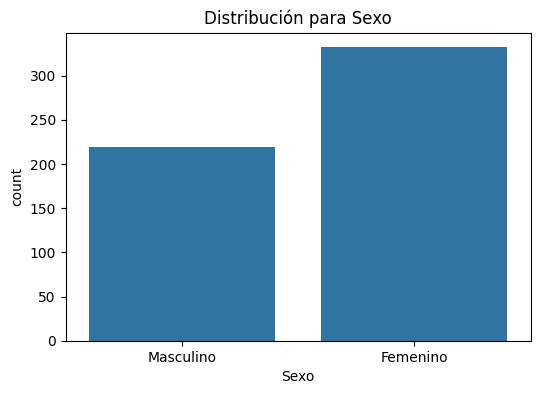

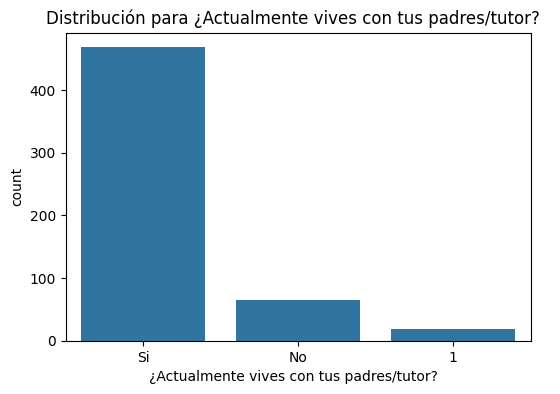

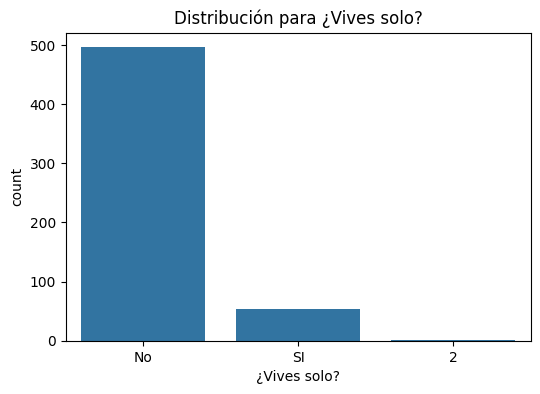

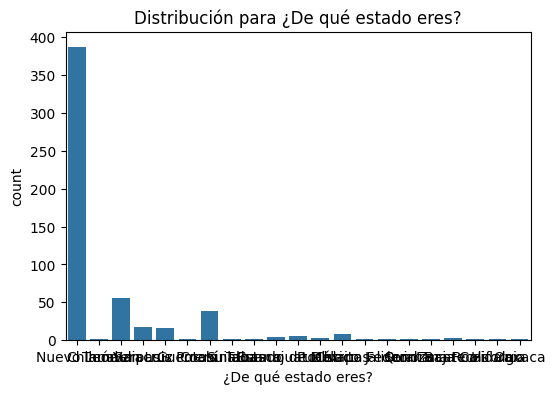

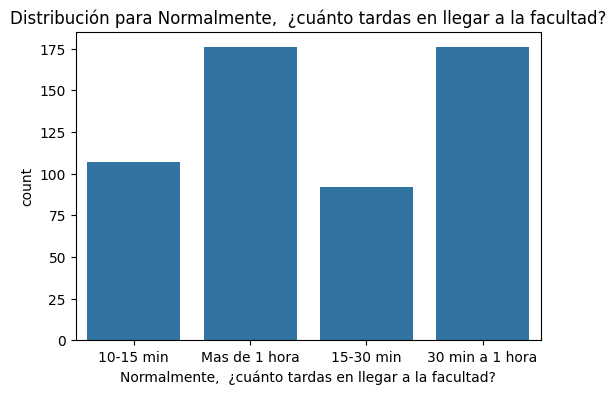

...

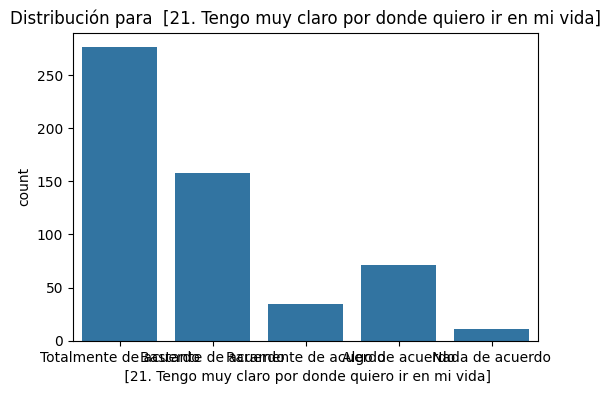

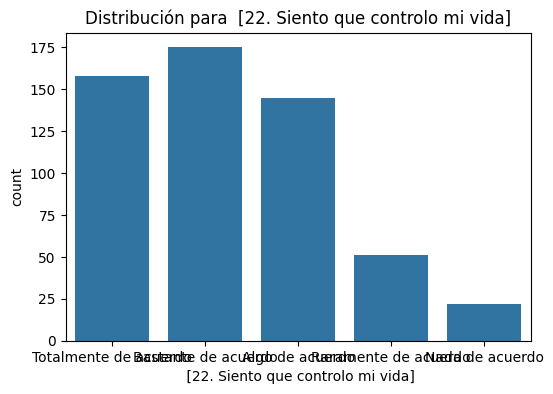

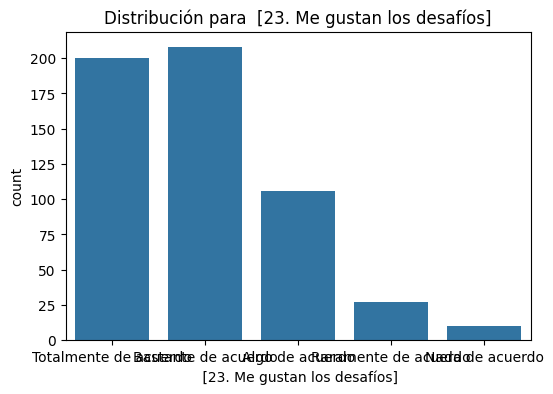

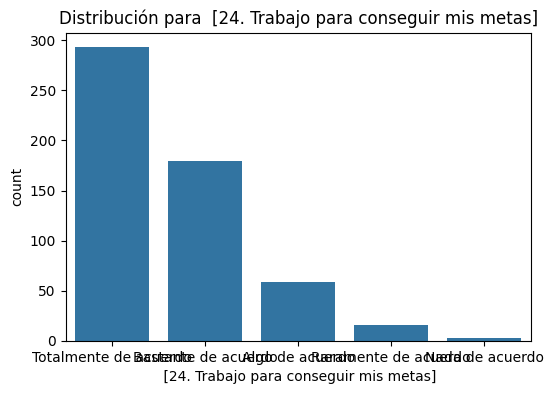

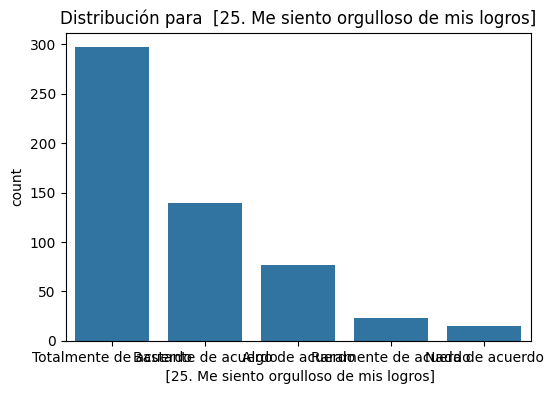

In [97]:
# Listar las columnas numéricas
categorical_columns = primera_bd.select_dtypes(include=['object']).columns

# Graficar diagrama de caja para cada variable numérica
for column in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=primera_bd[column])
    plt.title(f'Distribución para {column}')
    plt.show()

### Segunda bd

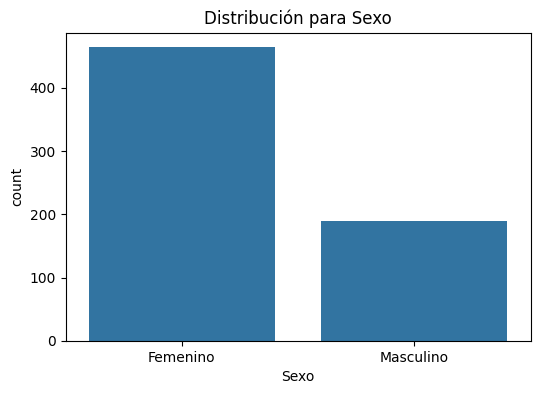

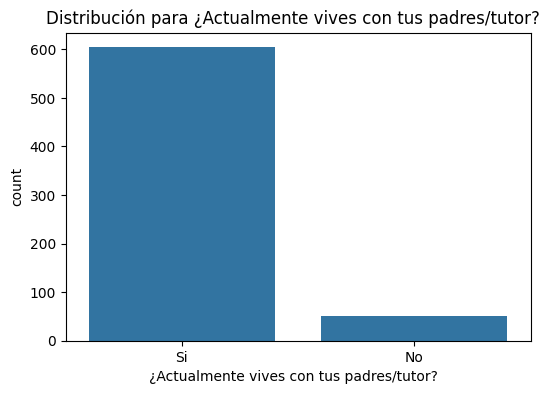

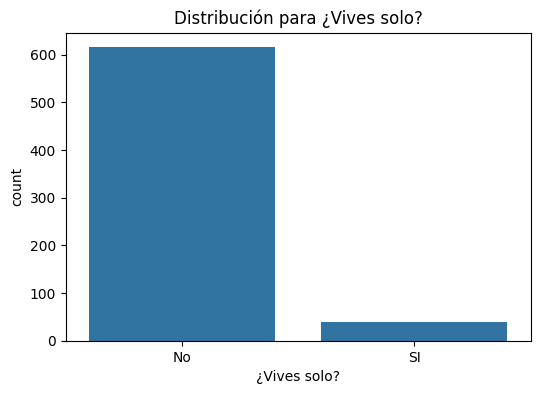

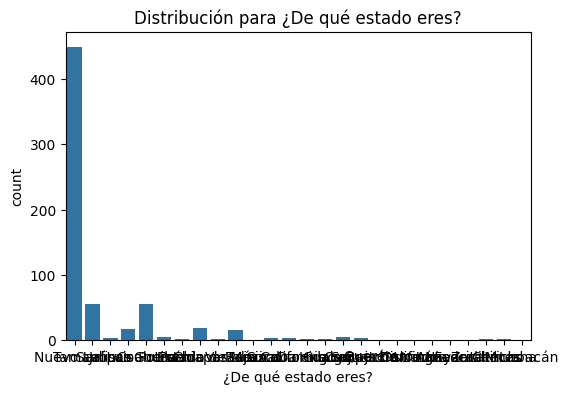

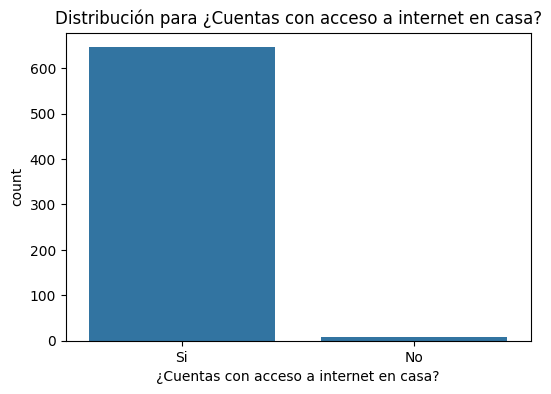

...

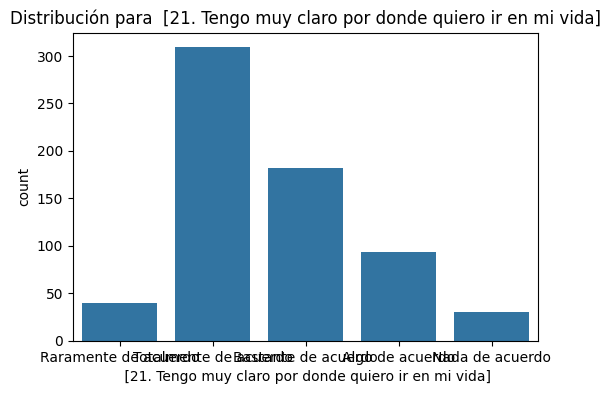

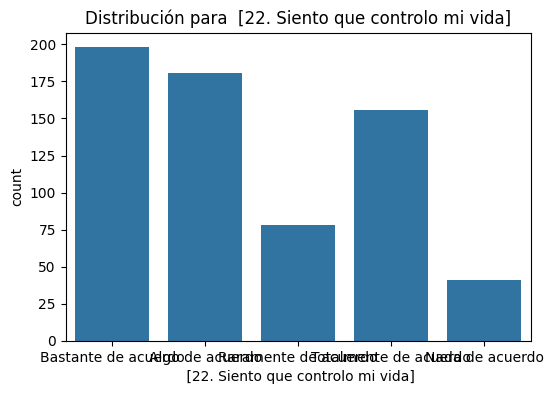

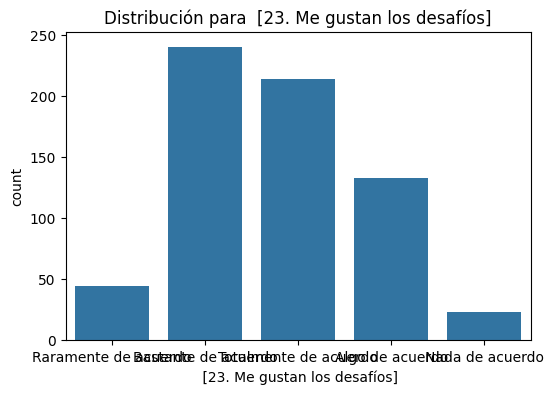

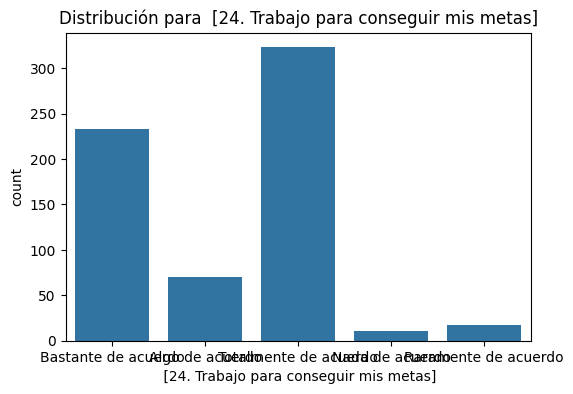

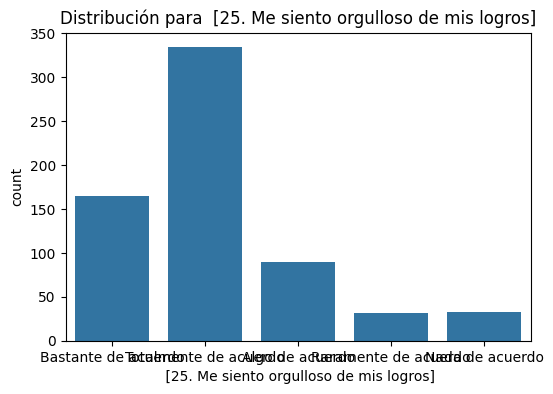

In [98]:
# Listar las columnas numéricas
categorical_columns = segunda_bd.select_dtypes(include=['object']).columns

# Graficar diagrama de caja para cada variable numérica
for column in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=segunda_bd[column])
    plt.title(f'Distribución para {column}')
    plt.show()

Mapeo de Respuestas Textuales a Números: Se convirtieron las respuestas de la encuesta a valores numéricos

In [ ]:
respuesta_map = {
    "Totalmente de acuerdo": 4,
    "Bastante de acuerdo": 3,
    "Algo de acuerdo": 2,
    "Raramente de acuerdo": 1,
    "Nada de acuerdo": 0,
    "Si": 1,
    "No": 2,
    "10-15 min": 1,
    "15-30 min": 2,
    "30 min a 1 hora": 3,
    "Mas de 1 hora": 4,
    "Femenino": 2,
    "Masculino": 1,
    "Baja California": 1,
    "Chiapas": 2,
    "Chihuahua": 3,
    "Coahuila": 4,
    "Distrito Federal": 5,
    "Estado de México": 6,
    "Guanajuato": 7,
    "Guerrero": 8,
    "Hidalgo": 9,
    "Jalisco": 10,
    "Nuevo León": 11,
    "Oaxaca": 12,
    "Puebla": 13,
    "Quintana Roo": 14,
    "San Luis Potosí": 15,
    "Sinaloa": 16,
    "Sonora": 17,
    "Tabasco": 18,
    "Tamaulipas": 19,
    "Veracruz": 20,
    "Zacatecas": 21,
    "Baja California Sur": 22,
    "Durango": 23,
    "Campeche": 24,
    "Querétaro": 25,
    "Yucatán": 26,
    "Nayarit": 27,
    "Aguascalientes": 28,
    "Michoacán": 29,
      "Propio": 1,
    "No propio": 2,
    "No cuento con el dispositivo": 3,
     "Femenino": 2,
     "Masculino": 1
}

for df in [primera_bd, segunda_bd]:
    for column in df.columns:
        if df[column].dtype == object:  # para verificar si la columna es de tipo objeto
            df[column] = df[column].map(respuesta_map)  # aplicar el mapeo


##¿Hay desequilibrio en las clases de la variable objetivo?

Como nuestra variable objetivo es un puntaje de 0 a 100, Para definir las clases de la variable objetivo se establecen inicialmente los niveles:
* Nivel bajo <= 50
* Nivel medio <= 80
* Nivel alto > 81

Sin embargo estos niveles podran ser ajustados posteriormente, teniendo en cuenta las reglas del negocio

In [181]:
# Definir la función para asignar las clases
def asignar_nivel(valor):
    if valor <= 50:
        return 'Nivel bajo'
    elif valor <= 80:
        return 'Nivel medio'
    else:
        return 'Nivel alto'

###Primera bd

In [187]:
# Aplicar la función a la columna VALOR_TOTAL
primera_bd['nivel_valor_total'] = primera_bd['PUNTAJE TOTAL'].apply(lambda x: asignar_nivel(x))

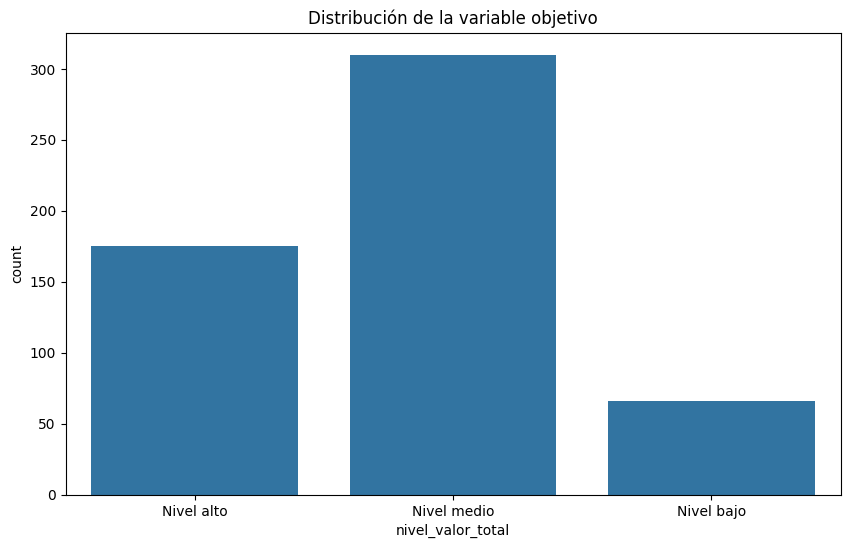

In [188]:
plt.figure(figsize=(10, 6))
sns.countplot(x='nivel_valor_total', data=primera_bd)
plt.title("Distribución de la variable objetivo")
plt.show()

Con esta información, se puede ver claramente que hay un desequilibrio entre las clases, ya que la clase media tiene una proporción mucho mayor que las clases baja y alta. Este desequilibrio podría influir en el rendimiento del modelo, especialmente si el algoritmo de aprendizaje es sensible al desequilibrio de clases. En ese caso se puede llegar a evaluar técnicas de remuestreo, como la submuestreo o la sobre-muestreo, o métodos de ajuste de peso de clase para abordar el problema.

### Segunda bd

In [189]:
# Aplicar la función a la columna VALOR_TOTAL
segunda_bd['nivel_valor_total'] = segunda_bd['PUNTAJE TOTAL'].apply(lambda x: asignar_nivel(x))

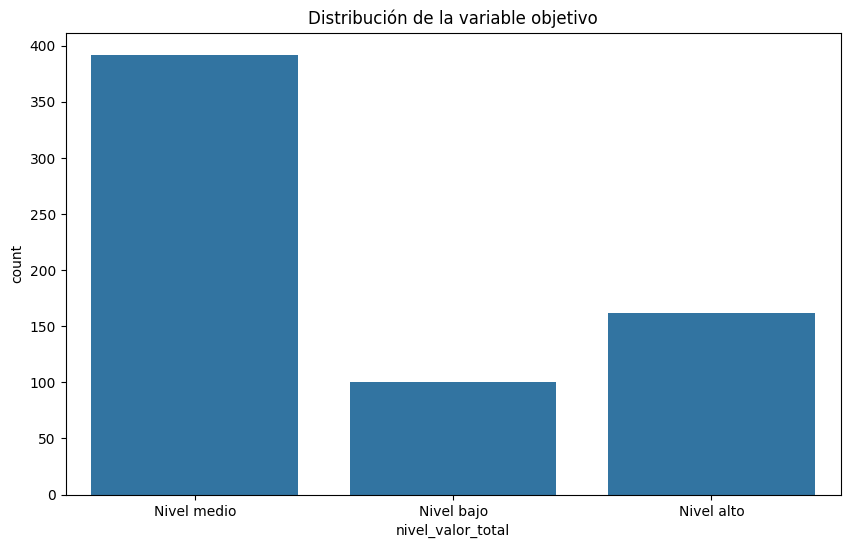

In [190]:
plt.figure(figsize=(10, 6))
sns.countplot(x='nivel_valor_total', data=segunda_bd)
plt.title("Distribución de la variable objetivo")
plt.show()

Con esta información, se puede ver claramente que hay un desequilibrio entre las clases, ya que la clase media tiene una proporción mucho mayor que las clases baja y alta. Este desequilibrio podría influir en el rendimiento del modelo, especialmente si el algoritmo de aprendizaje es sensible al desequilibrio de clases. En ese caso se puede llegar a evaluar técnicas de remuestreo, como la submuestreo o la sobre-muestreo, o métodos de ajuste de peso de clase para abordar el problema.

## Análsis preliminar: Verificación de registros

Se observa que las columnas que originalmente contenían respuestas en forma de texto ahora han sido transformadas a valores numérico.
En la segunda base de datos se observan columnas adicionales en comparación con la primera base de datos.

In [ ]:
print(primera_bd.head())
print(segunda_bd.head())


           Marca temporal  Edad  Sexo  \
0 2020-09-14 13:44:00.462    18     1   
1 2020-09-14 13:44:05.584    18     1   
2 2020-09-14 14:28:36.419    18     1   
3 2020-09-14 14:28:42.086    18     1   
4 2020-09-14 15:45:41.336    19     1   

   ¿Actualmente vives con tus padres/tutor?    ¿Vives solo?  \
0                                         1.0           2.0   
1                                         1.0           2.0   
2                                         1.0           2.0   
3                                         1.0           2.0   
4                                         1.0           2.0   

   ¿De qué estado eres?  \
0                  11.0   
1                  11.0   
2                  11.0   
3                  11.0   
4                  11.0   

   Normalmente,  ¿cuánto tardas en llegar a la facultad?  \
0                                                  1       
1                                                  1       
2                              

Tratamiento Valores Faltantes


Datos Faltantes. Se identificaron valores faltantes en ambas bases de datos (primera_bd y segunda_bd)

In [ ]:
# Identificar valores faltantes
print(primera_bd.isnull().sum())
print(segunda_bd.isnull().sum())

Marca temporal                                                                                                                                          0
Edad                                                                                                                                                    0
Sexo                                                                                                                                                    0
¿Actualmente vives con tus padres/tutor?                                                                                                               18
¿Vives solo?                                                                                                                                           53
¿De qué estado eres?                                                                                                                                    2
Normalmente,  ¿cuánto tardas en llegar a la facultad?                       

Se Identificaron columnas con valores nulos significativos, especialmente en la "Segunda BD"

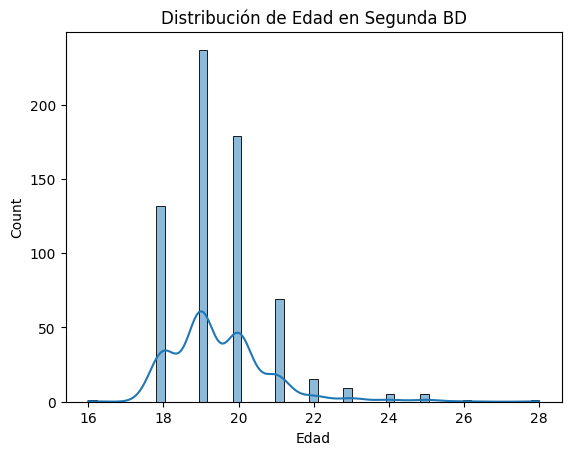

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

if segunda_bd['Edad'].notna().all():
    sns.histplot(segunda_bd['Edad'], kde=True)
    plt.title('Distribución de Edad en Segunda BD')
    plt.show()


Decidimos realizar la imputación de datos faltantes para preservar la integridad y utilidad de nuestro conjunto de datos durante el análisis. Utilizando métodos estadísticos y de machine learning, podemos estimar valores razonables para los datos ausentes, permitiendo así análisis más completos y precisos.

Se aplicaron dos métodos para manejar valores faltantes en la base de datos: primero, usamos la mediana para rellenar los valores ausentes en las columnas numéricas, lo cual proporciona un buen balance entre los valores; después, implementamos KNN Imputer, que predice los valores faltantes utilizando los datos de vecinos más cercanos, ayudando así a mantener la coherencia del conjunto de datos.

In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer, KNNImputer


primera_bd = primera_bd.dropna(axis=1, how='all')

for column in primera_bd.columns:
    if primera_bd[column].dtype == object:
        primera_bd[column] = primera_bd[column].map(respuesta_map)

# excluimos columnas de fecha antes de aplicar KNNImputer
columnas_numericas = primera_bd.select_dtypes(include=['int64', 'float64']).columns

# Crear el imputador de la mediana y aplicarlo
imputer_num = SimpleImputer(strategy='median')
imputed_data = imputer_num.fit_transform(primera_bd[columnas_numericas])
primera_bd[columnas_numericas] = pd.DataFrame(imputed_data, columns=columnas_numericas)

# Crear y aplicar KNNImputer para imputar otros valores faltantes
imputer_knn = KNNImputer(n_neighbors=5)
imputed_data = imputer_knn.fit_transform(primera_bd[columnas_numericas])
primera_bd[columnas_numericas] = pd.DataFrame(imputed_data, columns=columnas_numericas)



<ipython-input-17-09003f4a771d>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  primera_bd[columnas_numericas] = pd.DataFrame(imputed_data, columns=columnas_numericas)
<ipython-input-17-09003f4a771d>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  primera_bd[columnas_numericas] = pd.DataFrame(imputed_data, columns=columnas_numericas)


In [ ]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# Eliminar columnas completamente vacías
primera_bd.dropna(axis=1, how='all', inplace=True)
segunda_bd.dropna(axis=1, how='all', inplace=True)


In [ ]:
# Imputación con IterativeImputer
imputer = IterativeImputer(estimator=RandomForestRegressor(), missing_values=np.nan, max_iter=10, random_state=0)

In [ ]:
# Actualización de columnas numéricas para cada base de datos
num_columns_primera = primera_bd.select_dtypes(include=['int64', 'float64']).columns
num_columns_segunda = segunda_bd.select_dtypes(include=['int64', 'float64']).columns

In [ ]:
# Aplicar la imputación en ambas bases de datos
primera_bd[num_columns_primera] = imputer.fit_transform(primera_bd[num_columns_primera])
segunda_bd[num_columns_segunda] = imputer.fit_transform(segunda_bd[num_columns_segunda])

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [ ]:
# Verificación final de valores faltantes
print("Valores faltantes en primera BD:", primera_bd.isnull().sum().sum())
print("Valores faltantes en segunda BD:", segunda_bd.isnull().sum().sum())

Valores faltantes en primera BD: 0
Valores faltantes en segunda BD: 0


Imputaremos valores faltantes para asgurarnos que no transformemos valores NaN

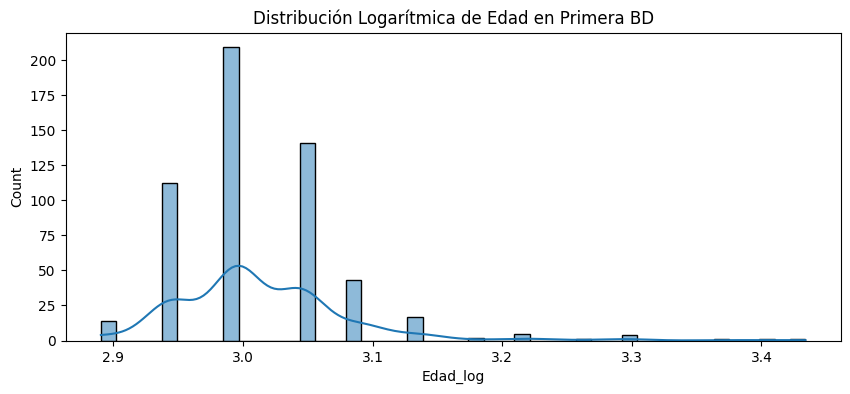

In [ ]:
# Aplicar transformación logarítmica
primera_bd['Edad_log'] = np.log1p(primera_bd['Edad'])

# Visualizar la distribución después de la transformación
plt.figure(figsize=(10, 4))
sns.histplot(primera_bd['Edad_log'], kde=True)
plt.title('Distribución Logarítmica de Edad en Primera BD')
plt.show()

Pruebas Estadisticas

In [ ]:
import scipy.stats as stats
grupo1 = primera_bd[primera_bd['Sexo'] == 1]['Edad']
grupo2 = primera_bd[primera_bd['Sexo'] == 2]['Edad']

In [ ]:
# T-test para comparar las medias de dos grupos independientes
t_stat, p_val = stats.ttest_ind(grupo1, grupo2)
print(f"T-statistic: {t_stat}, P-value: {p_val}")

T-statistic: 2.5560510506864498, P-value: 0.0108548868784675


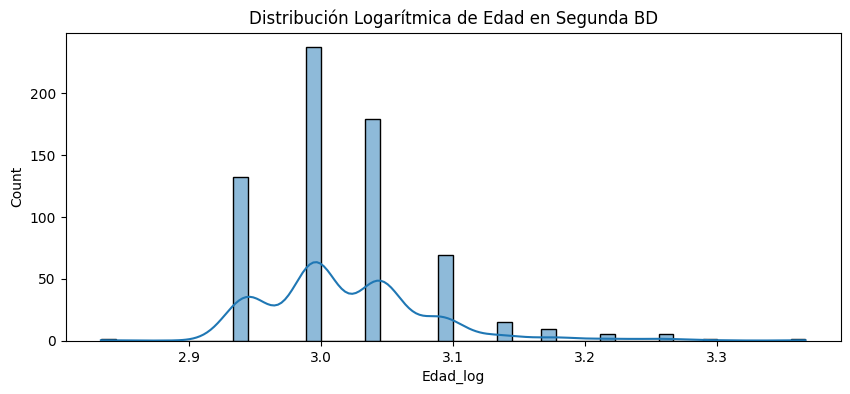

In [ ]:
# Aplicar transformación logarítmica
segunda_bd['Edad_log'] = np.log1p(segunda_bd['Edad'])

# Visualizar la distribución después de la transformación
plt.figure(figsize=(10, 4))
sns.histplot(segunda_bd['Edad_log'], kde=True)
plt.title('Distribución Logarítmica de Edad en Segunda BD')
plt.show()

PCA

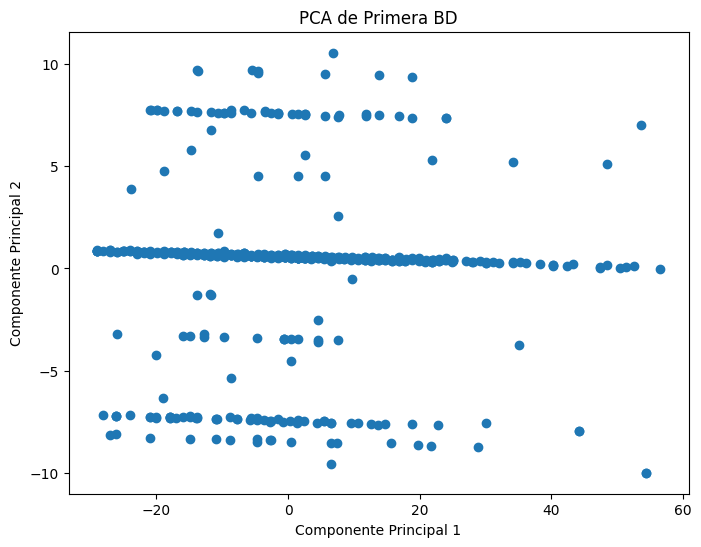

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)  # Reducir a dos componentes
pca_resultados = pca.fit_transform(primera_bd[num_columns_primera])

plt.figure(figsize=(8, 6))
plt.scatter(pca_resultados[:, 0], pca_resultados[:, 1])
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('PCA de Primera BD')
plt.show()

In [ ]:
# Cargar los componentes principales
print("Carga de los componentes principales:")
print(pd.DataFrame(pca.components_, columns=primera_bd[num_columns_primera].columns, index=['PC1', 'PC2']))


Carga de los componentes principales:
        Edad      Sexo  ¿Actualmente vives con tus padres/tutor?    \
PC1  0.00077 -0.000034                                   -0.001021   
PC2 -0.00384 -0.007736                                   -0.010993   

     ¿Vives solo?  ¿De qué estado eres?  \
PC1  1.444931e-35             -0.009683   
PC2 -2.489101e-26             -0.998462   

     Normalmente,  ¿cuánto tardas en llegar a la facultad?  \
PC1                                           0.007702       
PC2                                           0.013257       

     ¿Actualmente trabajas?  \
PC1           -6.628001e-35   
PC2           -2.029608e-26   

     ¿Es la primera universidad a la que aplicaste? Si la respuesta es no ¿Cuántos intentos te tomó entrar a universidades previas?   \
PC1                                      -1.059040e-34                                                                                 
PC2                                       3.677398e-27              

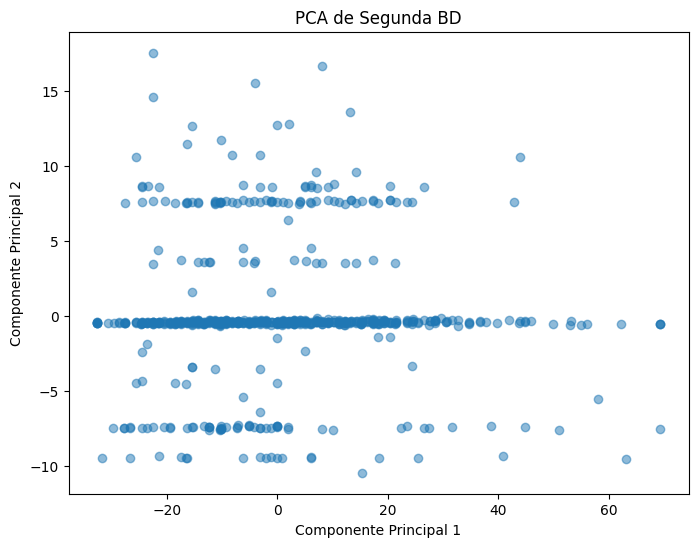

In [ ]:
# Asegurarse de que la base de datos no tenga valores faltantes en las columnas numéricas
segunda_bd[num_columns_segunda] = segunda_bd[num_columns_segunda].fillna(segunda_bd[num_columns_segunda].median())

# aplicacion de PCA
pca = PCA(n_components=2)  # Reducir a dos componentes
pca_resultados = pca.fit_transform(segunda_bd[num_columns_segunda])

# visucalizacion de resultados
plt.figure(figsize=(8, 6))
plt.scatter(pca_resultados[:, 0], pca_resultados[:, 1], alpha=0.5)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('PCA de Segunda BD')
plt.show()


In [ ]:
# Cargar y mostrar los componentes principales
componentes_df = pd.DataFrame(pca.components_, columns=segunda_bd[num_columns_segunda].columns, index=['PC1', 'PC2'])
print("Carga de los componentes principales:")
print(componentes_df)

Carga de los componentes principales:
         Edad      Sexo  ¿Actualmente vives con tus padres/tutor?    \
PC1 -0.001496  0.001235                                   -0.000349   
PC2  0.003504 -0.005053                                    0.002267   

     ¿Vives solo?  ¿De qué estado eres?  \
PC1  1.989974e-34             -0.000139   
PC2 -1.866688e-25              0.997702   

     ¿Cuentas con acceso a internet en casa?  \
PC1                                 0.000237   
PC2                                -0.000290   

     ¿Cuentas con dispositivo electrónico? [Telefono inteligente (smartphone)]  \
PC1                                           0.000754                           
PC2                                          -0.003918                           

     ¿Cuentas con dispositivo electrónico? [Tableta]  \
PC1                                         0.004120   
PC2                                         0.003019   

     ¿Cuentas con dispositivo electrónico? [Computadora (

Estadísticas Descriptivas

Los resultados que se muestran abajo nos permite observar que en la primera base, los datos están más completos y organizados, mientras que la segunda muestra varios valores faltantes que podrían complicar análisis más profundos.

In [ ]:
# Estadísticas descriptivas para ambas bases de datos
print(primera_bd.describe())
print(segunda_bd.describe())

                      Marca temporal        Edad        Sexo  \
count                            551  551.000000  551.000000   
mean   2020-09-14 00:47:21.674105088   19.426497    1.602541   
min       2020-09-08 12:19:16.294000   17.000000    1.000000   
25%    2020-09-11 15:47:57.872999936   19.000000    1.000000   
50%    2020-09-14 14:28:36.419000064   19.000000    2.000000   
75%    2020-09-14 21:26:18.131500032   20.000000    2.000000   
max       2020-10-02 22:00:48.842000   30.000000    2.000000   
std                              NaN    1.492267    0.489817   

       ¿Actualmente vives con tus padres/tutor?    ¿Vives solo?  \
count                                  551.000000         551.0   
mean                                     1.117967           2.0   
min                                      1.000000           2.0   
25%                                      1.000000           2.0   
50%                                      1.000000           2.0   
75%                  

Identificación de Valores Atípicos. Visualizacion de la distribución de los datos.

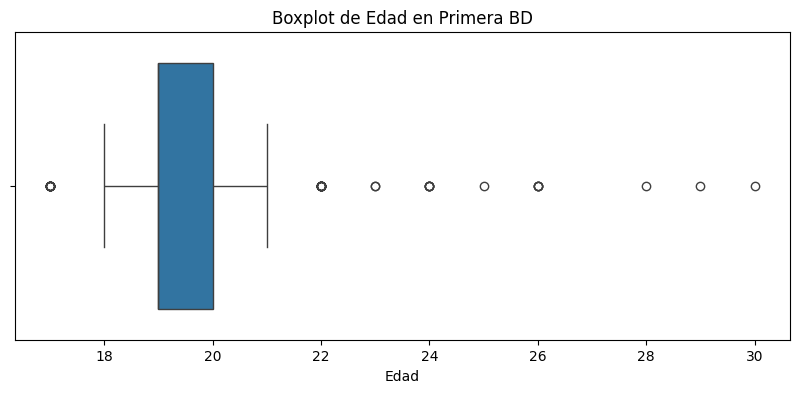

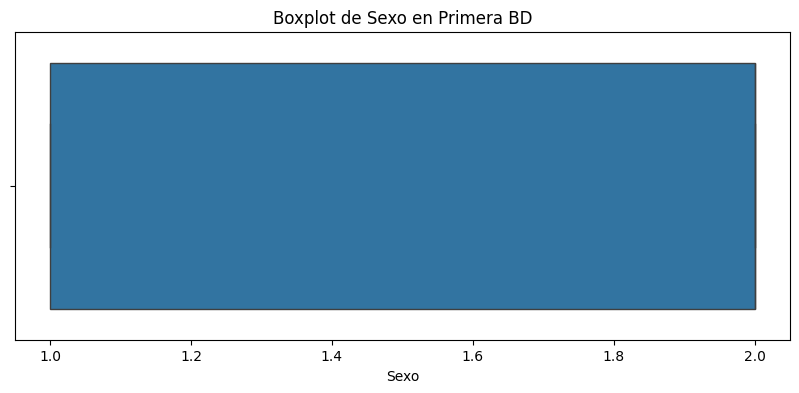

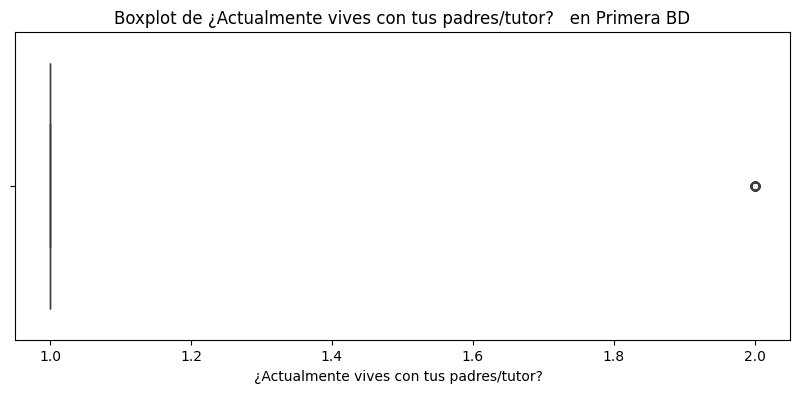

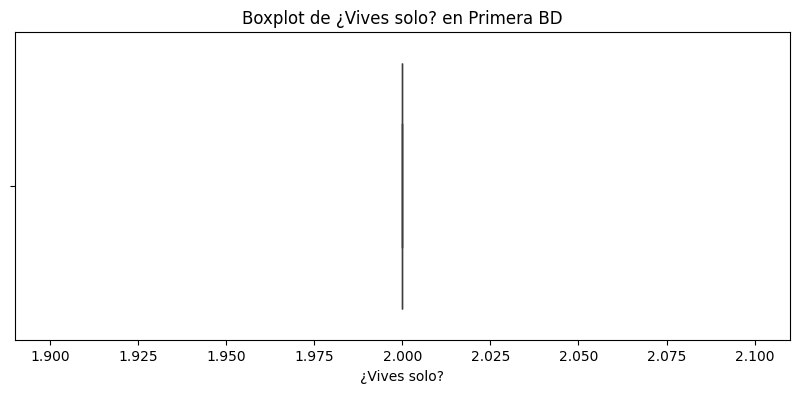

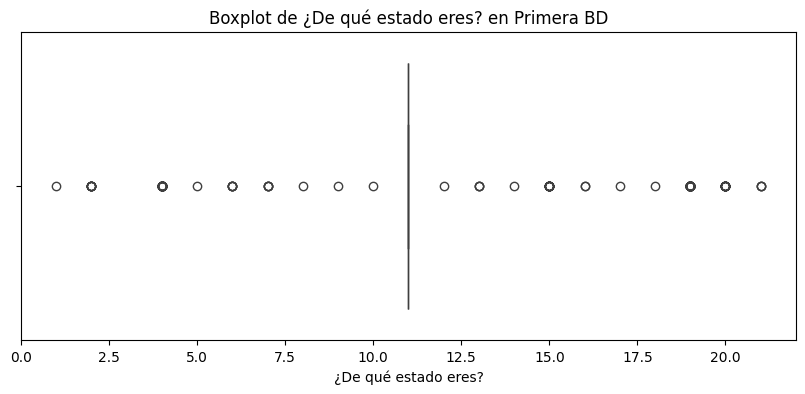

...

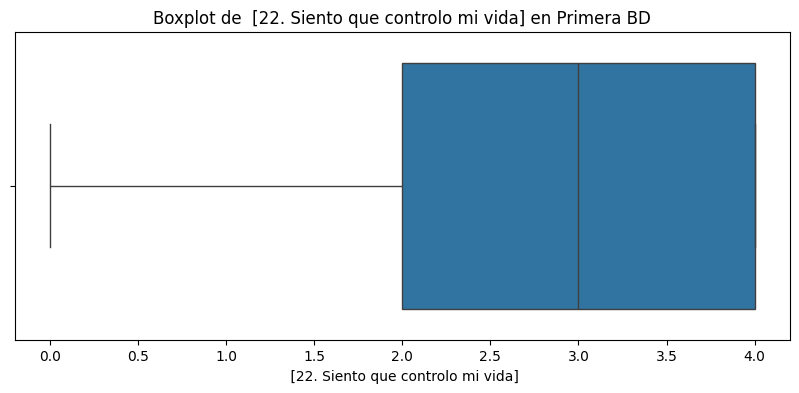

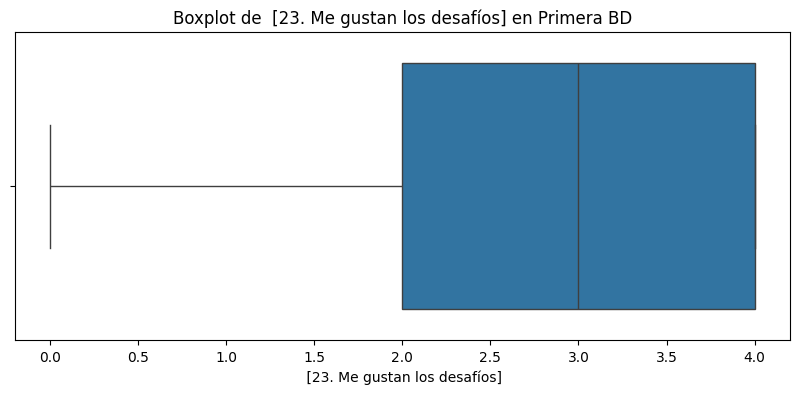

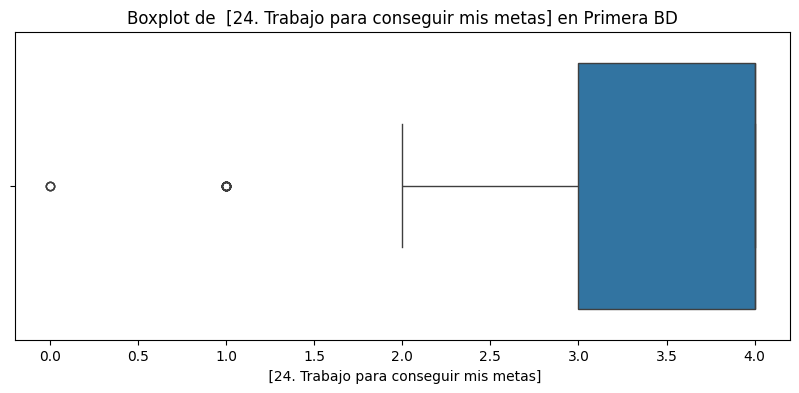

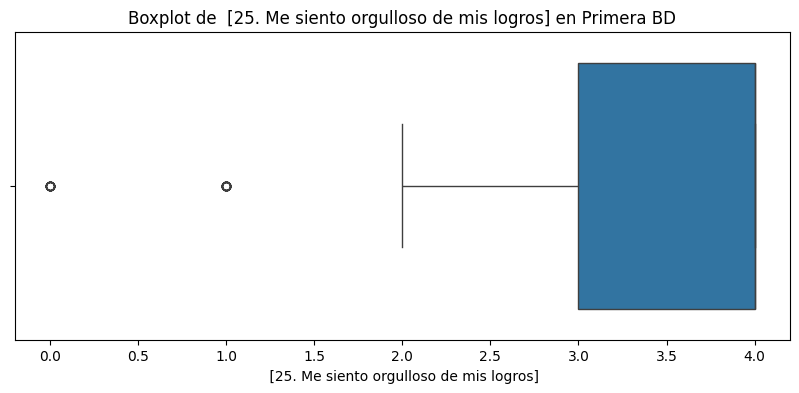

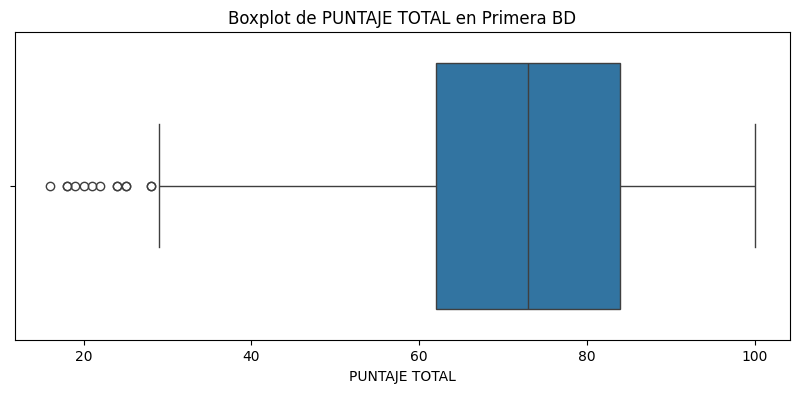

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que la columna tiene suficientes datos no nulos para graficar
for column in primera_bd.select_dtypes(include=['int64', 'float64']).columns:
    if primera_bd[column].notna().sum() > 1:  # Es para asegurarse de que haya al menos dos valores no nulos
        plt.figure(figsize=(10, 4))
        sns.boxplot(x=primera_bd[column].dropna())  # Descartar los valores nulos
        plt.title(f'Boxplot de {column} en Primera BD')
        plt.show()
    else:
        print(f"La columna {column} no tiene suficientes datos no nulos para graficar.")



Análisis de Cardinalidad

In [ ]:
# Cardinalidad de las variables categóricas en ambas bases de datos
print("Cardinalidad en Primera BD:")
print(primera_bd.select_dtypes(include=['object']).nunique())

print("Cardinalidad en Segunda BD:")
print(segunda_bd.select_dtypes(include=['object']).nunique())

Cardinalidad en Primera BD:
Series([], dtype: float64)
Cardinalidad en Segunda BD:
Series([], dtype: float64)


Los resultados muestran que no hay columnas de tipo 'object' en ninguna de las bases de datos, lo cual nos facilitará el análisis y modelado estadístico al no requerir transformaciones adicionales de codificación.

Análisis de Distribuciones y Transformaciones

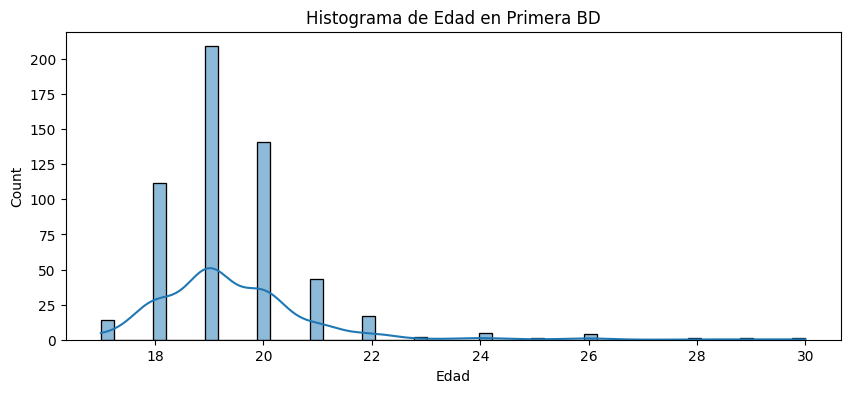

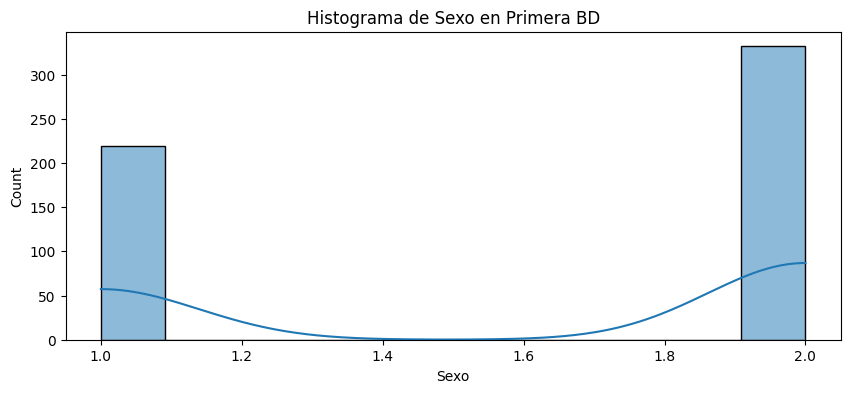

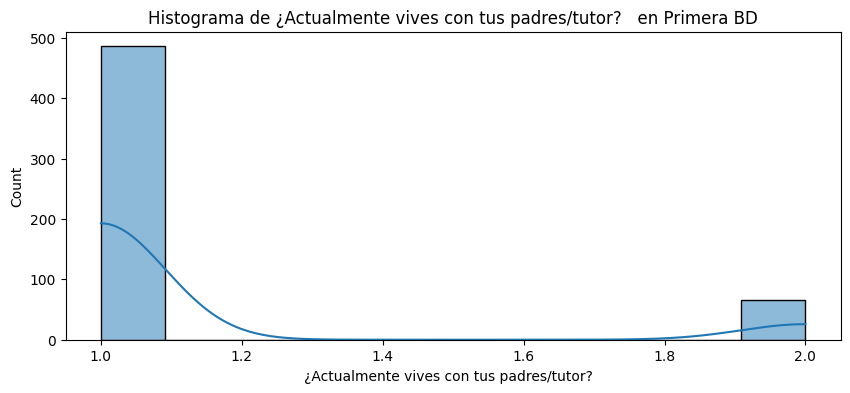

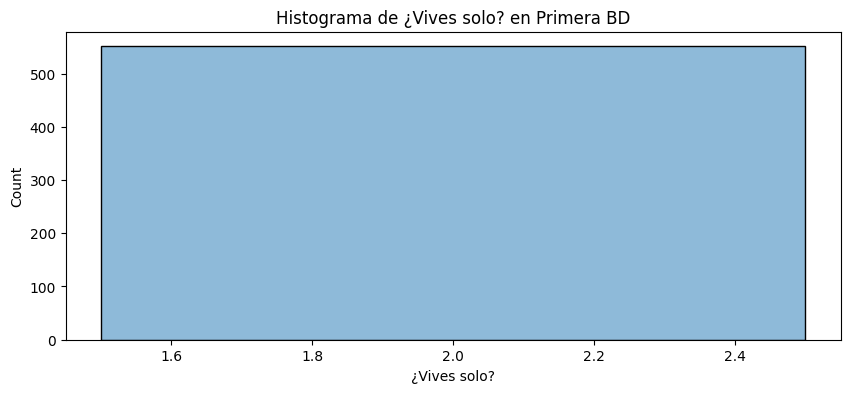

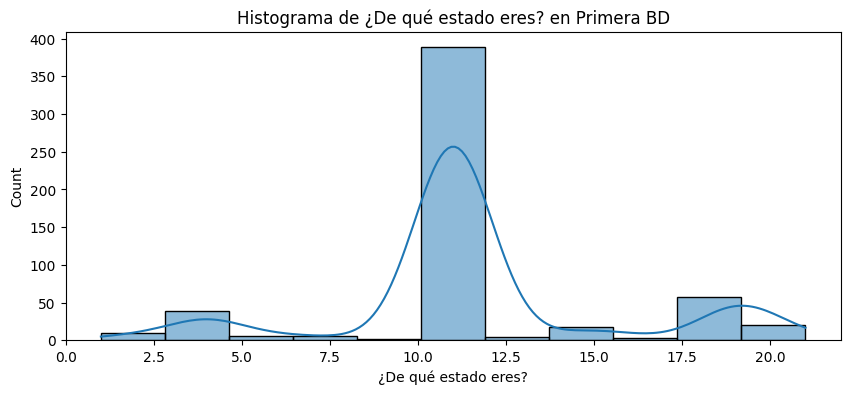

...

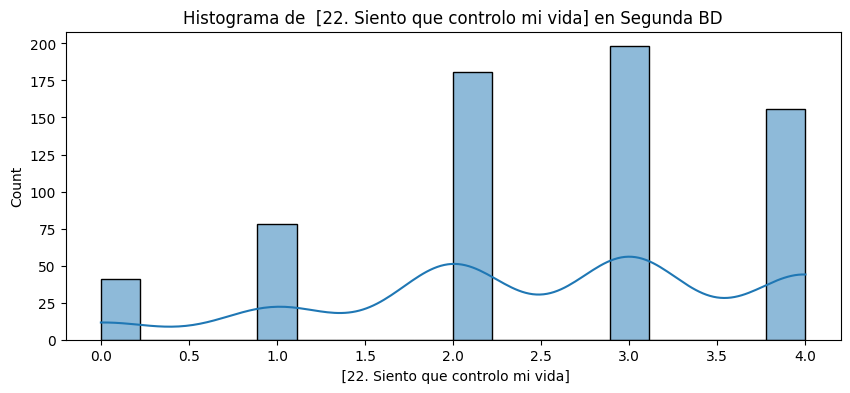

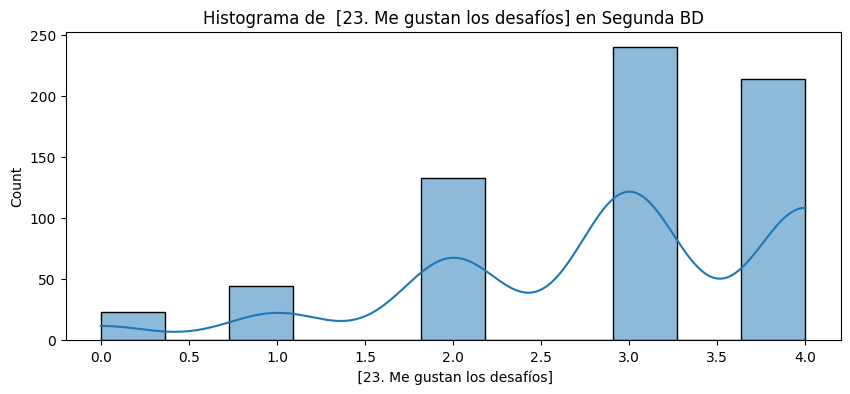

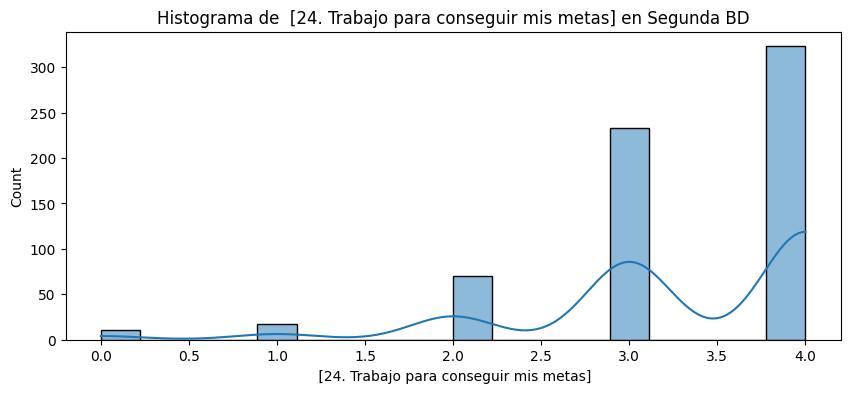

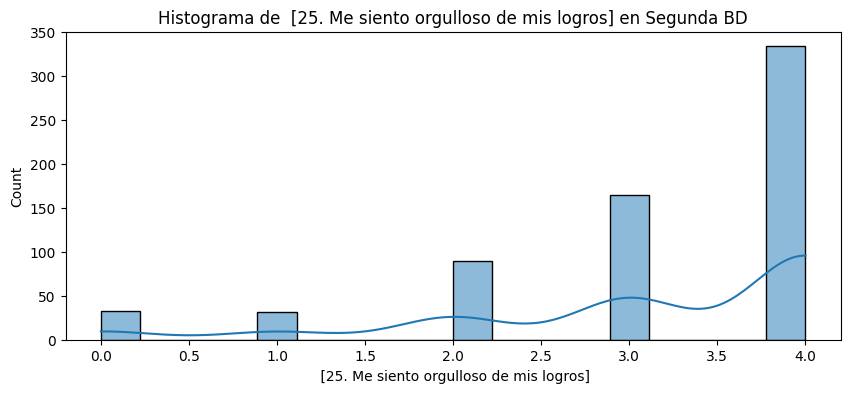

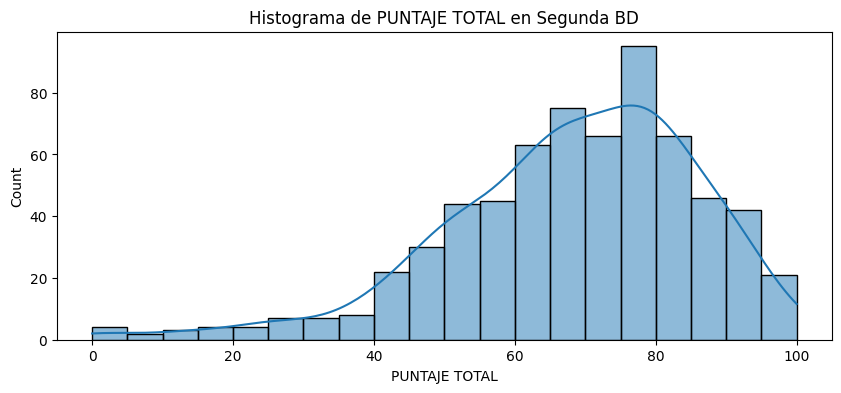

In [ ]:
# Histogramas para Primera BD
for column in primera_bd.select_dtypes(include=['int64', 'float64']).columns:
    plt.figure(figsize=(10, 4))
    sns.histplot(primera_bd[column], kde=True)
    plt.title(f'Histograma de {column} en Primera BD')
    plt.show()

# Histogramas para Segunda BD
for column in segunda_bd.select_dtypes(include=['int64', 'float64']).columns:
    plt.figure(figsize=(10, 4))
    sns.histplot(segunda_bd[column], kde=True)
    plt.title(f'Histograma de {column} en Segunda BD')
    plt.show()

Correlaciones

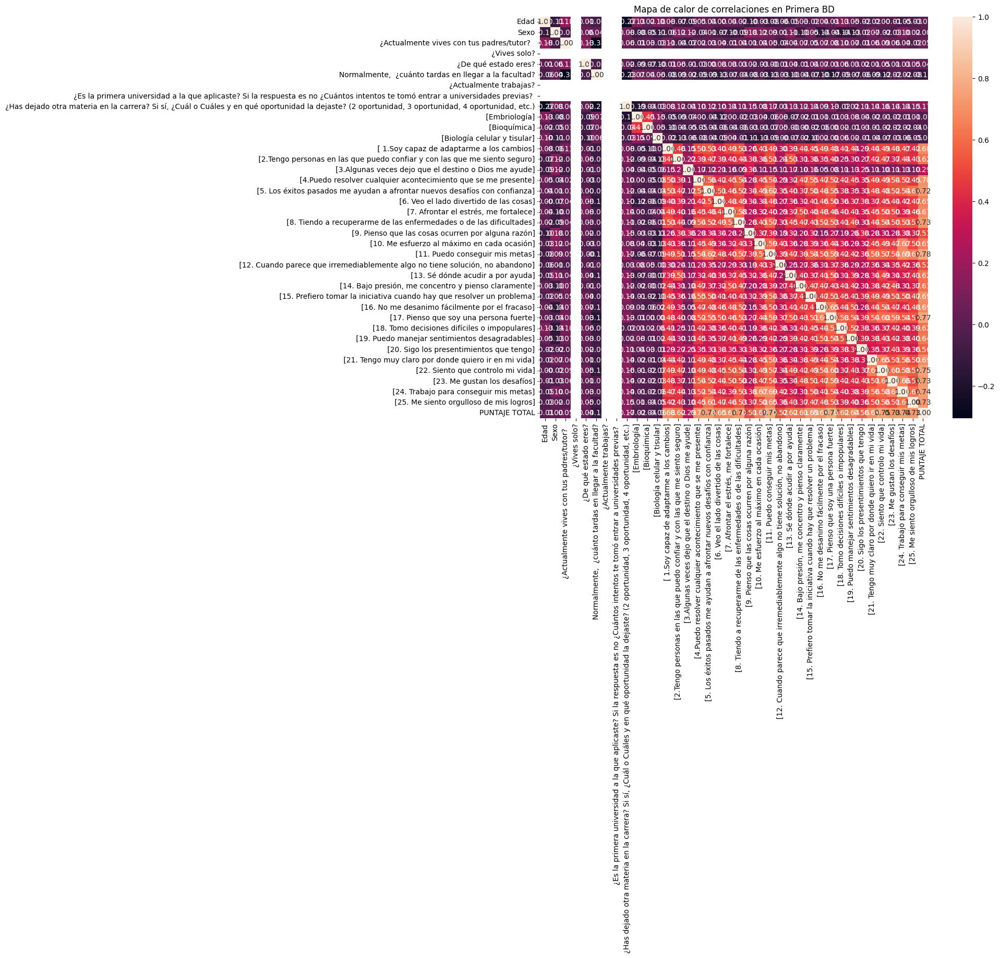

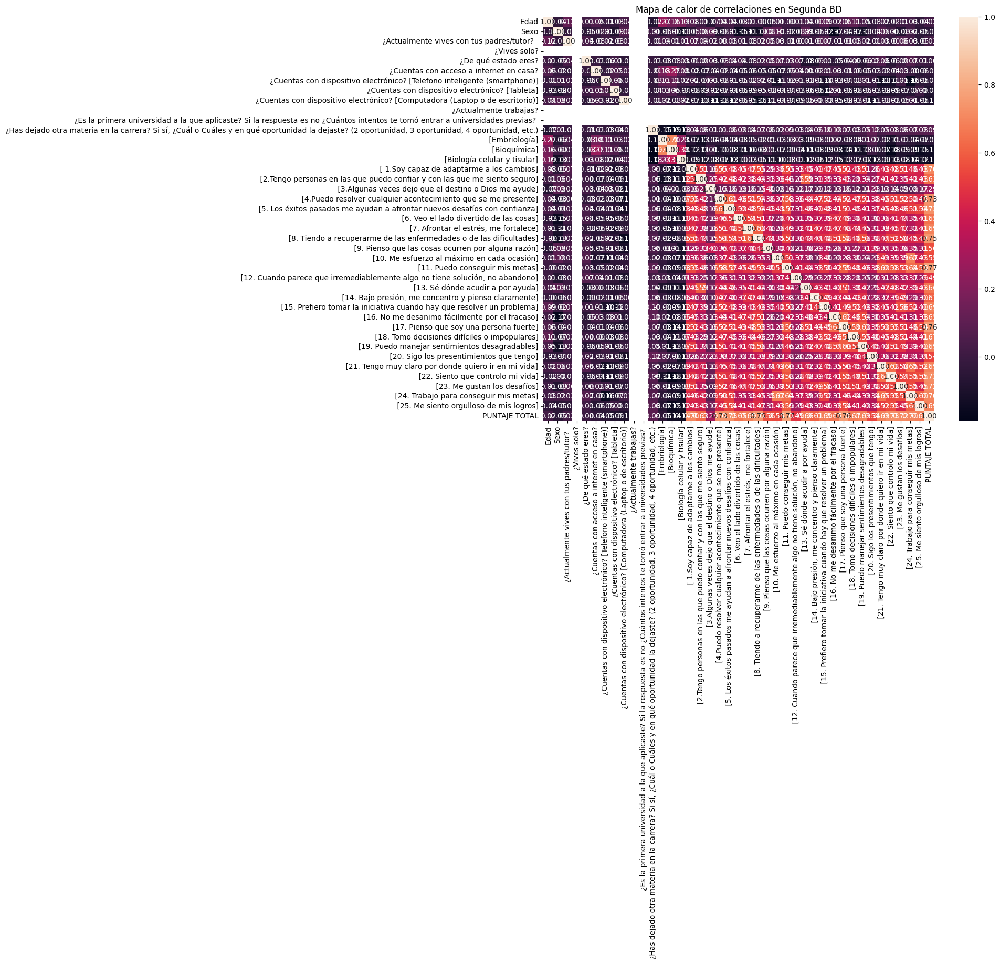

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar solo columnas numéricas para la correlación
correlaciones_primera_bd = primera_bd.select_dtypes(include=['float64', 'int64']).corr()
correlaciones_segunda_bd = segunda_bd.select_dtypes(include=['float64', 'int64']).corr()

# Mapa de calor de correlaciones para Primera BD
plt.figure(figsize=(12, 10))
sns.heatmap(correlaciones_primera_bd, annot=True, fmt=".2f")
plt.title("Mapa de calor de correlaciones en Primera BD")
plt.show()

# Mapa de calor de correlaciones para Segunda BD
plt.figure(figsize=(12, 10))
sns.heatmap(correlaciones_segunda_bd, annot=True, fmt=".2f")
plt.title("Mapa de calor de correlaciones en Segunda BD")
plt.show()


